In [1]:
import pandas as pd
import geopandas as gp
import pdv_functions as pdv
import numpy as np
import re

# VEST PA 2020
---

## VEST Documentation

### Sources

#### Election Results
Election results primarily from individual county precinct reports as processed via OpenElections (https://github.com/openelections/openelections-data-pa/). Precinct data was corrected with canvass reports for the following counties: Cambria, Crawford, Forest, Juniata, York. The Susquehanna County precinct results were provided by the Pennsylvania Secretary of State Bureau of Elections.

Due to court orders involving ballots that were segregated until legal challenges were resolved the certified results from nearly all counties differ from the official results certified by the state. State courts ordered segregated ballots to be included for state offices whereas federal courts ordered that they be excluded for federal offices. As the orders were issued after the county certification deadline these votes were added to the state offices for 57 counties that did not include them in precinct reports and removed from federal offices in 10 counties that did include them in precinct reports. The precinct results in the VEST shapefiles are those that were certified by the respective counties.

Federal ballots in Philadelphia were reported at the citywide level. These are distributed by candidate to precincts based on their share of the precinct-level reported vote.

#### Shapefiles
Precinct shapefiles primarily from the U.S. Census Bureau's 2020 Redistricting Data Program Phase 2 release. The shapefiles from Delaware County and the City of Pittsburgh are from the respective jurisdictions. Precinct numbers were corrected to match the 2020 voter file in the following locales: Allegheny (Elizabeth, Pittsburgh W12), Blair (Greenfield), Bradford (Athens), Greene (Dunkard, Monongahela), Monroe (Smithfield), Montgomery (Hatfield), Northampton (Bethlehem Twp), Perry (Toboyne), Union (Union), Washington (New Eagle, Somerset), York (Fairview). VTD codes in Philadelphia were edited to match the city ward/division numbers.

The U.S. Census Bureau's final VTD release was used for all of Crawford, Jefferson, McKean, Northumberland. A number of precincts statewide were also replaced with the final VTDs due to updated municipal boundaries. 

The final VTD release was also used for precincts that were altered before the 2020 general election in the following locales: Adams (Reading), Allegheny (Marshall), Armstrong (Ford City), Cambria (N Cambria), Centre (State College), Chester (Valley N), Clearfield (Bradford), Franklin (Montgomery, Peters), Greene (Dunkard), Lebanon (Cornwall, Jackson, N Cornwall, S Londonderry, Swatara), Luzerne (Butler, Dallas, Fairview, Kingston Boro, Kingston Twp, Rice, Salem, Sugarloaf, Wright), Lycoming (Williamsport), Mercer (S Pymatuning), Monroe (Jackson), Montgomery (New Hanover, Upper Merion), Northampton (Allen), Philadelphia (Wards 2, 5, 8, 18, 21, 40, 63), Venango (Cranberry), Washington (Amwell, Cecil, Donegal, N Strabane, S Strabane); Westmoreland: (Murrysville), York (W Manheim).

Precinct boundaries throughout the state were edited to match voter assignments in the PA Secretary of State voter file from the 2020 election cycle. While some edits reflect official updates to wards or divisions the majority involve voters incorrectly assigned to voting districts by the counties. As such the VEST shapefile endeavors to reflect the de facto precinct boundaries and these often differ from the official voting district boundaries in some cases quite drastically. Wherever possible edits were made using census boundaries or alternatively using the parcel shapefiles from the respective counties. 

### Processing
In certain areas voter assignments appear so erratic that it is impractical to place all voters within their assigned precinct. These areas were edited so as to place as many voters as possible within their assigned precinct without displacing a greater number from their assigned precinct. In general, municipal boundaries were retained except where a significant number of voters were misassigned to the wrong municipality. In cases where the odd/even split was incorrectly reversed for precinct boundary streets the official boundary was retained. All such cases involved near equal number of voters swapped between voting districts.

The following revisions were made to the base shapefiles to match the de facto 2020 precinct boundaries consistent with the voter file. Individual precincts are noted in cases of splits or merges. Due to the sheer number of edits boundary adjustments are listed at the borough/township level. There may be as many as two dozen individual precincts that were revised within a given municipality.

In some cases the edited precinct boundaries noted below match those of the final Census VTD release.

- Adams: Adjust Cumberland, Franklin
- Allegheny: Split Pittsburgh W5 11/17; Merge Pittsburgh W16 9/11/12; Align McCandless with municipal boundary; Adjust Baldwin, Bethel Park, Braddock, Brentwood, Castle Shannon, Clairton, Collier, Coraopolis, Crescent, Dormont, Dravosburg, Duquesne, E Deer, E McKeesport, E Pittsburgh, Elizabeth, Emsworth, Forward, Glassport, Hampton, Harmar, Ingram, Jefferson Hills, Kennedy, Leet, Liberty, Marshall, McCandless, McKees Rocks, McKeesport, Monroeville, Moon, Mount Lebanon, Munhall, N Fayette, N Versailles, O'Hara, Oakdale, Penn Hills, Pine, Pittsburgh (nearly all wards), Pleasant Hills, Reserve, Richland, Ross, Scott, Sewickley, Shaler, S Fayette, S Park, Stowe, Swissvale, Upper St. Clair, W Deer, W Homestead, W Mifflin, W View, Whitaker, Whitehall, Wilkins, Wilkinsburg
- Armstrong: Align Dayton, Elderton, Ford City, Kittanning, N Apollo with municipal boundaries; Adjust Cowanshannock, Ford City, Gilpin, Kiskiminetas, Kittanning, Manor, N Buffalo, Parks, Parker City, S Buffalo
- Beaver: Adjust Aliquippa, Ambridge, Baden, Beaver, Brighton, Center, Chippewa, Conway, Economy, Franklin, Hanover, Harmony, Hopewell, Midland, Monaca, N Sewickley
- Bedford: Adjust Bedford Boro, Bedford Twp
- Berks: Adjust Cumru, Douglass, Earl, Oley, Maxatawny, Robeson, Sinking Spring, Union
- Blair: Merge Tunnelhill/Allegheny Twp 4; Align Altoona, Bellwood, Duncansville, Hollidaysburg, Newry, Roaring Spring, Tyrone, Williamsburg with municipal boundaries; Adjust Allegheny, Altoona, Antis, Frankstown, Freedom, Greenfield, Huston, Juniata, N Woodbury, Logan, Snyder, Tyrone Boro, Tyrone Twp
- Bucks: Align Sellersville, Tullytown with municipal boundaries; Adjust Bensalem, Bristol Boro, Bristol Twp, Buckingham, Doylestown Twp, Falls, Hilltown, Lower Makefield N, Lower Southampton E, Middletown, Milford, Morrissville, Newtown Twp, Northampton, Solebury Lower, Solebury, Springfield, Tinicum, Upper Makefield, Upper Southampton E, Warminster, Warrington, W Rockhill
- Butler: Align Butler Twp, Valencia with municipal boundaries; Adjust Adams, Buffalo, Butler Boro, Butler Twp, Center, Cranberry E, Cranberry W, Jackson, Jefferson, Zelienople
- Cambria: Align Daisytown, Sankertown, W Taylor, Wilmore with municipal boundaries; Adjust Cambria, Conemaugh, Croyle, E Taylor, Ebensburg, E Carroll, Geistown, Jackson, Johnstown W8, W17, W20, Lower Yoder, Northern Cambria, Portage Boro, Portage Twp, Richland, Southmont, Stonycreek, Summerhill, Susquehanna, Upper Yoder, W Carroll, Westmont
- Cameron: Adjust Emporium, Shippen
- Carbon: Adjust Jim Thorpe, Kidder, Mahoning, New Mahoning, Summit Hill
- Centre: Merge Ferguson Northeast 1 A/B; Adjust Benner,  Ferguson, Patton
- Chester: Adjust Birmingham, E Bradford S, E Fallowfield, E Goshen, E Marlborough, Easttown, N Coventry, Spring City, Tredyffrin M, Uwchlan, Valley N, W Bradford, W Caln, W Goshen N, W Goshen S, Westtown
- Clarion: Align Shippenville with municipal boundary; Merge Emlenton/Richland; Adjust Clarion, Highland, Farmington, Knox
- Clearfield: Adjust Decatur, Woodward
- Columbia: Merge Ashland/Conyngham; Adjust Orange, Scott West
- Crawford: Align Cochranton, Richmond with municipal boundaries
- Cumberland: Split Lower Allen 1/Annex; Align Carlisle, E Pennsboro, Hampton, Lemoyne, Lower Allen, Mechanisburg, Middlesex, Mount Holly Springs, N Middleton, Shiremanstown, Silver Spring, W Pennsboro, Wormsleysburg with municipal boundaries
- Dauphin: Align Middletown with municipal boundary; Adjust Derry, Harrisburg W1, W7, W8, W9, Hummelstown, Lower Paxton, Lykens, Middletown
- Delaware: Adjust Chester, Concord, Darby Boro, Darby Twp, Haverford, Marple, Nether Providence, Newtown, Radnor, Ridley, Sharon Hill, Thornbury, Tinicum, Trainer, Upper Chichester, Upper Darby, Upper Providence
- Elk: Adjust Johnsonburg, Ridgeway Boro, Ridgeway Twp, St. Marys
- Erie: Adjust Erie W1, W4, W5, W6, Greene, Lawrence Park, McKean, Millcreek, North East
- Fayette: Align Dunbar, Uniontown with municipal boundaries; Adjust Brownsville, Bullskin, Dunbar, Georges, German, Luzerne, N Union, Redstone
- Franklin: Align Mercersburg with municipal boundary; Adjust Antrim, Fannett, Greene, Guilford, Hamilton, Metal, Peters, Quincy, St. Thomas, Southampton, Washington
- Fulton: Align McConnellsburg with municipal boundary
- Greene: Align Carmichaels with municipal boundary; Adjust Cumberland, Franklin, Jefferson, Lipencott, Mather, Morgan Chart, Monongahela, Nemacolin
- Huntingdon: Adjust Huntingdon, Mount Union
- Jefferson: Adjust Punxsutawney
- Lackawanna: Adjust Archbald, Blakely, Carbondale, Clarks Summit, Dickson City, Dunmore, Fell, Jermyn, Jessup, Mayfield, Moosic, Old Forge, Olyphant, Scranton W1, W2, W3, W6, W7, W10, W12, W13, W14, W15, W16, W19, W20, W23, S Abington, Taylor, Throop
- Lancaster: Split Lancaster 7-8 CV/LS; Adjust Brecknock, Columbia, E Hempfield, E Lampeter, E Petersburg, Elizabethtown, Ephrata, Lancaster W4, W8, Lititz, Manheim, Manor, Millersville, Mt Joy Twp, New Holland, Penn, Providence, Rapho, Warwick, W Cocalico, W Donegal, W Hempfield
- Lawrence: Adjust Neshannock
- Lebanon: Adjust Cornwall, S Lebanon
- Lehigh: Split Allentown Ward 17-4/Parkland; Adjust Lower Macungie, Salisbury
- Luzerne: Align Avoca, Pittston with municipal boundaries; Adjust Butler, Exeter, Fairview, Foster, Hanover, Hazle, Jenkins, Larksville, Lehman, Nanticoke, Plains, Smoyersville, W Wyoming, Wilkes-Barre
- Lycoming: Adjust Jersey Shore
- McKean: Align Foster with municipal boundary; Adjust Bradford, Bradford Twp, Foster, Hamlin, Keating
- Mercer: Adjust Delaware, Fredonia, Greenville, Hempfield, Hermitage, Sharon, Sharpsville, W Salem
- Mifflin: Split Brown Reedsville/Church Hill
- Monroe: Align E Stroudsburg with municipal boundary; Adjust E Stroudsburg, Smithfield, Stroud, Tobyhanna
- Montgomery: Adjust Abington, Lower Merion, Pottstown, Springfield, Upper Moreland, Upper Merion, Upper Providence
- Northampton: Align Glendon, Walnutport with municipal boundaries; Adjust Bangor, Bethlehem W2, W3, W4, W7, W9, W14, W15, Bethlehem Twp, Bushkill, Easton, Forks, Hanover, Hellertown, Lehigh, Lower Mt Bethel, Lower Saucon, Moore, Nazareth, Palmer, Plainfield, Upper Mt Bethel, Washington, Williams
- Northumberland: Adjust Coal, Kulpmont, Marion Heights, Milton, Mount Carmel, Northumberland, Point, Ralpho, Shamokin, Sunbury, Upper Augusta
- Philadelphia: Adjust 1-19/21, 5-3/19, 7-2/3/17, 7-6/7, 9-5/6, 15-7/10, 17-20/26, 20-5/10, 21-1/15, 21-40/41, 22-21/26, 23-11/12, 25-9/17, 25-4/7/12, 25-10/12, 26-1/2, 27-7/8, 27-18/20/21, 28-1/8, 29-9/11, 29-10/17, 30-14/15, 31-5/6, 38-11/17, 38-13/20, 38-15/19, 40-12/18/19, 40-17/19, 42-3/4/7, 44-8/14, 50-3/12, 50-11/27, 52-2/6/9, 52-3/8, 57-6/7, 57-10/27, 57-17/28, 58-6/12, 62-5/19, 65-4/7, 65-11/16, 66-22/34
- Pike: Adjust Matamoras
- Potter: Adjust Galeton
- Schuylkill: Adjust Coaldale, N Manheim, Norwegian, Porter, Pottsville
- Somerset: Align New Centerville with municipal boundary; Adjust Conemaugh, Jefferson, Middlecreek, Paint, Somerset Boro
- Susquehanna: Adjust Montrose; Lanesboro, Susquehanna Depot
- Tioga: Adjust Delmar, Wellsboro
- Union: Adjust Buffalo, White Deer
- Venango: Adjust Cornplanter, Cranberry, Franklin, Oil City, Sugarcreek
- Warren: Adjust Conewango
- Washington: Align Allenport, Beallsville, Burgettstown, Canonsburg, Carroll, Charleroi, Claysville, Elco, Finleyville, Houston, Long Branch, McDonald, Midway, Monongahela, Speers, Twilight with municipal boundaries; Adjust Amwell, Bentleyville, California, Canonsburg, Canton, Cecil, Centerville, Chartiers, Donora, Fallowfield, Hanover, Independence, Mount Pleasant, N Franklin, N Strabane, Peters, Robinson, Smith, Somerset, S Franklin, Union Washington, W Brownsville
- Wayne: Adjust Honesdale
- Westmoreland: Align Greensburg with municipal boundary; Adjust Allegheny, Arnold, Bell, Derry, E Huntingdon, Fairfield, Greensburg W1-W8, Hempfield, Jeannette, Latrobe, Ligonier, Lower Burrell, Monessen, Mount Pleasant, New Kensington, N Belle Vernon, N Huntingdon, Penn, Rostraver, St. Clair, Scottdale, Sewickley, S Greensburg, S Huntingdon, Trafford, Upper Burrell, Unity, Vandergrift, Washington, Youngwood
- York: Align E Prospect, Goldsboro, Jefferson, Manchester, Monaghan, Wellsville, York with municipal boundaries; Adjust Chanceford, Codorus, Conewago, Dover, Fairview, Hanover, Jackson, Lower Windsor, New Freedom, Newberry, N Codorus, Penn, Red Lion, Shrewsbury, Spring Garden, Springbettsbury, W Manchester, Windsor Boro, Windsor Twp, Wrightsville, York Twp, York W5, W6, W15




### Races

G20PREDBID - Joseph R. Biden (Democratic Party)  
G20PRERTRU - Donald J. Trump (Republican Party)  
G20PRELJOR - Jo Jorgensen (Libertarian Party)  

G20ATGDSHA - Joshua D. Shapiro (Democratic Party)  
G20ATGRHEI - Heather S. Heidelbaugh (Republican Party)  
G20ATGLWAS - Daniel Wassmer (Libertarian Party)  
G20ATGGWEI - Richard L. Weiss (Green Party)  

G20AUDDAHM - Nilofer Nina Ahmad (Democratic Party)  
G20AUDRDEF - Timothy L. DeFoor (Republican Party)  
G20AUDLMOO - Jennifer Lynn Moore (Libertarian Party)  
G20AUDGFAI - Olivia Faison (Green Party)  

G20TREDTOR - Joseph M. Torsella (Democratic Party)  
G20TRERGAR - Stacy L. Garrity (Republican Party)  
G20TRELSOL - Joseph P. Soloski (Libertarian Party)  
G20TREGRUN - Timothy Runkle (Green Party)  

## Election Result Processing

### Load in VEST file

In [2]:
vest_pa_20 = gp.read_file("./raw-from-source/VEST/pa_2020/pa_2020.shp")

In [3]:
cand_columns = [i for i in vest_pa_20.columns if "G20" in i]

<AxesSubplot:>

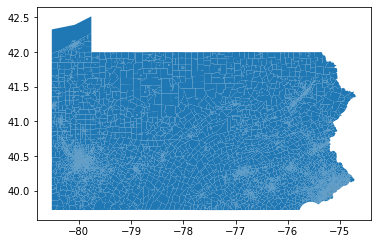

In [4]:
vest_pa_20.plot()

## Load in Shapefiles

Note: Comparing instead against the VTDs released by PA as part of redistricting

In [5]:
official_pa_blocks = gp.read_file("./raw-from-source/Shapefiles/Geography/WP_VotingDistricts.shp")

In [6]:
official_pa_blocks.shape

(9178, 74)

In [7]:
vest_pa_20.shape

(9150, 20)

In [8]:
official_pa_blocks["Precinct_Detailed"] = official_pa_blocks["FIPS"] + "-" + official_pa_blocks["VTD"]

In [9]:
id_update_dict = {'003-003236':'003-003235',
'003-00F398':'003-00F397',
'003-00F399':'003-00F397',
'003-00F409':'003-00F408',
'003-00F412':'003-00F408',
'011-000299':'011-000300',
'011-000301':'011-000300',
'011-000391':'011-000390',
'011-000393':'011-000390',
'019-000353':'019-000355',
'019-000354':'019-000355',
'019-000358':'019-000357',
'019-000359':'019-000357',
'019-000362':'019-000361',
'019-000363':'019-000361',
'019-000366':'019-000365',
'019-000367':'019-000365',
'019-000546':'019-000545',
'019-000547':'019-000545',
'019-000556':'019-000555',
'019-000557':'019-000555',
'027-000212':'027-000210',
'027-000214':'027-000210',
'027-000261':'027-000262',
'027-000263':'027-000262',
'027-000264':'027-000268',
'027-000265':'027-000268',
'029-000917':'029-000915',
'029-000919':'029-000915',
'041-000601':'041-000600',
'041-000602':'041-000600',
'041-000621':'041-000620',
'041-000622':'041-000620',
'045-002810':'045-002815',
'045-002820':'045-002815',
'049-001316':'049-001319',
'049-001325':'049-001315',
'079-000806':'079-000805',
'079-000807':'079-000805',
'079-001782':'079-001785',
'087-000042':'087-000040-BROWN REEDSVILLE/BIG VA',
'087-000044':'087-000040-BROWN CHURCH HILL',
'091-000915':'091-000916',
'091-000918':'091-000916',
'091-001085':'091-001086',
'091-001092':'091-001086',
'091-001731':'091-001730',
'091-001732':'091-001730',
'091-001741':'091-001740',
'091-001742':'091-001740',
'091-002195':'091-002194',
'097-000871':'097-000870',
'097-000872':'097-000870',
'121-000596':'121-000595',
'129-002851':'129-002850',
'129-002852':'129-002850',
'133-001427':'133-001429',
'133-001428':'133-001429'}


In [10]:
official_pa_blocks["Precinct_Detailed"] = official_pa_blocks["Precinct_Detailed"].map(id_update_dict).fillna(official_pa_blocks["Precinct_Detailed"])

In [11]:
official_pa_blocks = official_pa_blocks.dissolve(["Precinct_Detailed"])

In [12]:
official_pa_blocks.reset_index(inplace = True, drop = False)

In [13]:
## Correct the Philly VTD Numberings

In [14]:
def get_philly_correct(prec_id):
    if "PHILADELPHIA WARD" not in prec_id:
        return prec_id
    else:
        first = prec_id.split(" ")[2]
        second = prec_id.split(" ")[4]

        first = str(first).zfill(4)
        second = str(second).zfill(2)
        return "101"+"-"+ first + second

In [15]:
official_pa_blocks.loc[official_pa_blocks["FIPS"]=="101", "Precinct_Detailed"] = official_pa_blocks.loc[official_pa_blocks["FIPS"]=="101"]["NAME"].apply(get_philly_correct)

In [16]:
vest_pa_20

,STATEFP,COUNTYFP,VTDST,NAME,G20PREDBID,G20PRERTRU,G20PRELJOR,G20ATGDSHA,G20ATGRHEI,G20ATGLWAS,G20ATGGWEI,G20AUDDAHM,G20AUDRDEF,G20AUDLMOO,G20AUDGFAI,G20TREDTOR,G20TRERGAR,G20TRELSOL,G20TREGRUN,geometry
0,42,001,000010,ABBOTTSTOWN,137,345,5,136,332,7,7,124,327,20,8,129,332,11,9,"POLYGON Z ((-76.99801 39.88359 0.00000, -76.99..."
1,42,001,000020,ARENDTSVILLE,175,275,6,171,262,13,3,129,297,20,2,150,278,14,6,"POLYGON Z ((-77.31141 39.92625 0.00000, -77.30..."
2,42,001,000030,BENDERSVILLE,102,202,8,106,189,7,5,96,190,15,5,101,191,11,5,"POLYGON Z ((-77.25596 39.98075 0.00000, -77.25..."
3,42,001,000040,BERWICK,374,954,13,362,934,19,12,326,942,41,13,348,924,33,19,"MULTIPOLYGON Z (((-76.99558 39.88677 0.00000, ..."
4,42,001,000050,BIGLERVILLE,193,366,7,196,350,9,7,182,357,16,5,181,357,14,8,"POLYGON Z ((-77.25594 39.93043 0.00000, -77.25..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9145,42,091,000916,FRANCONIA PRECINCT 02,636,703,12,614,688,32,10,557,714,47,21,589,716,26,16,"POLYGON Z ((-75.33892 40.32714 0.00000, -75.33..."
9146,42,091,001091,HORSHAM DISTRICT 02 DIVISION 01,417,400,10,398,397,12,10,349,434,24,4,358,431,15,8,"POLYGON Z ((-75.19507 40.21769 0.00000, -75.19..."
9147,42,091,001143,HORSHAM DISTRICT 04 DIVISION 02,509,361,10,501,356,12,7,429,408,19,12,455,396,15,8,"POLYGON Z ((-75.21485 40.20134 0.00000, -75.21..."
9148,42,097,000870,UPPER MAHANOY,49,291,0,66,265,2,3,46,279,7,4,58,273,5,4,"POLYGON Z ((-76.69876 40.68991 0.00000, -76.69..."


In [17]:
vest_pa_20["Precinct_Detailed"] = vest_pa_20["COUNTYFP"] + "-" + vest_pa_20["VTDST"]

In [18]:
test_join = pd.merge(vest_pa_20, official_pa_blocks, how = "outer", on = "Precinct_Detailed", indicator = True)

In [19]:
test_join["_merge"].value_counts()

both          9148
right_only       8
left_only        2
Name: _merge, dtype: int64

In [20]:
#pdv.compare_geometries(vest_pa_20, official_pa_blocks, "VEST", "PL", "Precinct_Detailed", "precincts", area_threshold=.1)

In [21]:
test_join[test_join["_merge"]=="left_only"].to_csv("./only_vest.csv")
test_join[test_join["_merge"]=="right_only"].to_csv("./only_official_pa.csv")

In [22]:
test_join[test_join["_merge"]=="left_only"][["Precinct_Detailed", "NAME_x"]]

,Precinct_Detailed,NAME_x
5691,087-000040,BROWN REEDSVILLE/BIG VA
5692,087-000040,BROWN CHURCH HILL


In [23]:
test_join[test_join["_merge"]=="right_only"][["Precinct_Detailed","NAME_y"]]

,Precinct_Detailed,NAME_y
9150,013-0040P1,TUNNELHILL Voting District
9151,029-000036,BIRMINGHAM PRECINCT 02 (CD 05)
9152,031-0400P1,EMLENTON Voting District
9153,037-0335P1,ASHLAND Voting District
9154,051-0820P1,SEVEN SPRINGS Voting District
9155,087-000040-BROWN CHURCH HILL,BROWN PRECINCT Church Hill
9156,087-000040-BROWN REEDSVILLE/BIG VA,BROWN PRECINCT Reedsville/Big Valley Voting Di...
9157,091-001144,HORSHAM DISTRICT 04 DIVISION 02 (CD 04)


## Alternative Election Results Source

In [24]:
open_elections_results = pd.read_csv("./raw-from-source/openelections-data-pa-master/2020/20201103__pa__general__precinct.csv")

/var/folders/1t/0q4w6hm92mg_zxd84dfxmq3m0000gn/T/ipykernel_65605/947709454.py:1: DtypeWarning: Columns (3,6,8) have mixed types. Specify dtype option on import or set low_memory=False.
  open_elections_results = pd.read_csv("./raw-from-source/openelections-data-pa-master/2020/20201103__pa__general__precinct.csv")


### Use different files for Cambria, Juniata, and Wyoming Counties

In [25]:
cambria_oe = open_elections_results[open_elections_results["county"]=="Cambria"]
juniata_oe = open_elections_results[open_elections_results["county"]=="Juniata"]

not_cambria_juniata_wyoming_oe = open_elections_results[~open_elections_results["county"].isin(["Cambria", "Juniata", "Wyoming"])]

cambria_specific = pd.read_csv('./raw-from-source/openelections-data-pa-master/2020/counties/20201103__pa__general__cambria__precinct.csv')
juniata_specific = pd.read_csv("./raw-from-source/openelections-data-pa-master/2020/counties/20201103__pa__general__juniata__precinct_ph_modified.csv")
wyoming_specific = pd.read_csv("./raw-from-source/openelections-data-pa-master/2020/counties/20201103__pa__general__wyoming__precinct_ph_modified.csv")

wyoming_specific['absentee'] = 0
wyoming_specific['election_day'] = wyoming_specific['votes']

juniata_specific['absentee'] = 0
juniata_specific['election_day'] = juniata_specific['votes']

cambria_specific['absentee'] = 0
cambria_specific['election_day'] = cambria_specific['votes']

cambria_specific = cambria_specific[list(not_cambria_juniata_wyoming_oe.columns)]
juniata_specific = juniata_specific[list(not_cambria_juniata_wyoming_oe.columns)]
wyoming_specific = wyoming_specific[list(not_cambria_juniata_wyoming_oe.columns)]

cambria_specific.loc[cambria_specific["office"]=="Write-ins","office"]="President"

open_elections_results = pd.concat([not_cambria_juniata_wyoming_oe, cambria_specific, juniata_specific, wyoming_specific])
open_elections_results.reset_index(inplace = True, drop = True)

In [26]:
all_oe_races = open_elections_results[open_elections_results["office"].isin(['President', 'Attorney General', 'Auditor General',
       'State Treasurer'])]

all_oe_races.loc[:,"candidate"] = all_oe_races["candidate"].str.upper()

bad_cand_list = ['OVERVOTE', 'OVER VOTES', 'UNDER VOTES', 'NOT ASSIGNED','UNASSIGNED WRITE-INS','REJECTED WRITE-INS','UNRESOLVED WRITE-IN', 'SCATTER WRITE-IN','WRITE-IN: BLANK', 'WRITE-IN: INVALID', 'WRITE-IN: SCATTERED']

all_oe_races = all_oe_races[~all_oe_races["candidate"].isin(bad_cand_list)]

/var/folders/1t/0q4w6hm92mg_zxd84dfxmq3m0000gn/T/ipykernel_65605/533098308.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_oe_races.loc[:,"candidate"] = all_oe_races["candidate"].str.upper()


### Add a County FIPs Column

In [27]:
fips_dict = pdv.get_fips_dict("Pennsylvania")

all_oe_races.loc[:,"FIPS"] = all_oe_races.loc[:,"county"].map(fips_dict).fillna("N/a")

/var/folders/1t/0q4w6hm92mg_zxd84dfxmq3m0000gn/T/ipykernel_65605/1841173136.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_oe_races.loc[:,"FIPS"] = all_oe_races.loc[:,"county"].map(fips_dict).fillna("N/a")


### Clean Candidate Names

In [28]:
all_oe_races["candidate"].unique()

array(['JOSEPH R. BIDEN', 'DONALD J. TRUMP', 'JO JORGENSEN', 'WRITE-INS',
       'JOSH SHAPIRO', 'HEATHER HEIDELBAUGH', 'DANIEL WASSMER',
       'RICHARD L. WEISS', 'NINA AHMAD', 'TIMOTHY DEFOOR',
       'JENNIFER MOORE', 'OLIVIA FAISON', 'JOE TORSELLA',
       'STACY L. GARRITY', 'JOE SOLOSKI', 'TIMOTHY RUNKLE',
       'RICHARD L WEISS', 'STACY L GARRITY', 'WRITE-IN: BRIAN CARROLL',
       'WRITE-IN: HOWIE HAWKINS', 'JORGENSEN/COHE', 'HOWIE HAWKINS (W)',
       'PRESIDENT R. BODDIE (W)', 'BRIAN CARROLL (W)',
       'DEREK IRVING COLLINS (W)', 'RYAN EHRENREICH (W)',
       'JULIETTE JENNER (W)', 'JOE MCHUGH (W)',
       'JOHN MANIMAS MEDEIROS (W)', 'JAMES OGLE (W)', 'BROCK PIERCE (W)',
       'ALBERT RALEY (W)', 'DEBORAH ROUSE (W)', 'JADE SIMMONS (W)',
       'MARY RUTH CARO SIMMONS (W)', 'RONALD BRYAN SMITH (W)',
       'SILVIA STAGG (W)', 'CHRISTOPHER STRIED (W)',
       'SHEILA "SAMM" TITTLE (W)', 'ANN YEAGER (W)',
       'JORGENSEN AND COHEN', 'WRITE-IN (W)', 'R19 BODDIE (W)',
    

In [29]:
all_oe_races.loc[all_oe_races["party"].isna(), "party"] = "N/A"

all_oe_races.loc[(all_oe_races["FIPS"]=="127")&(all_oe_races["office"]=="Attorney General")&(all_oe_races["candidate"].str.contains("WEISS")),'party']="GRE"

In [30]:
all_oe_races["party"] = all_oe_races["party"].str.upper()

party_change_dict = {'DEMOCRATIC':'DEM',
 'REPUBLICAN':"REP",
 'LIBERTARIAN':"LIB",
 'GREEN':"GRN",
 'LBT':'LIB',
 'LBN':'LIB',
 'GRE':'GRN'}

all_oe_races["party"] = all_oe_races["party"].map(party_change_dict).fillna(all_oe_races["party"])


print(all_oe_races["party"].unique())

['DEM' 'REP' 'LIB' 'N/A' 'GRN']


In [31]:
all_oe_races.loc[all_oe_races["precinct"].str.contains("SPRINGFIELD 3W 2P"),"precinct"] = 'SPRINGFIELD 3W 2P'

In [32]:
all_oe_races.loc[(all_oe_races["FIPS"]=="109")&(all_oe_races["office"]=="President")&(all_oe_races["party"]=="LIB"), "candidate"] = 'JO JORGENSEN' 

In [33]:
all_oe_races["office"].unique()

array(['President', 'Attorney General', 'Auditor General',
       'State Treasurer'], dtype=object)

In [34]:
cand_change_dict = {'WRITE-INS': 'WRITE-IN',
 'DERREK IRVING COLLINS (W)': 'DEREK IRVING COLLINS (W)',
 'HOWIE HAWKINS (W)': 'HOWIE HAWKINS',
 'JORGENSEN/COHE': 'JO JORGENSEN',
 'SHEILA "SAMM" TITTLE (W)': 'SHEILA SAMM TITTLE (W)',
 'STACY GARRITY': 'STACY L GARRITY',
 'STACY L. GARRITY': 'STACY L GARRITY',
 'NINA AHMED': 'NINA AHMAD',
 'RICHARD L WEISS': 'RICHARD L. WEISS',
 'WRITE-IN: DONALD TRUMP': 'DONALD J. TRUMP',
 'WRITE-IN: HAWKINS HOWIE (ALL VARIANTS)': 'HOWIE HAWKINS',
 'WRITE-IN: HOWIE HAWKINS': 'HOWIE HAWKINS',
 'WRITE-IN: HOWIE HAWKINS & VARIATIONS': 'HOWIE HAWKINS',
 'RICHARD L. WEISS': 'RICHARD WEISS',
 'OLIVIA FASON GREEN': 'OLIVIA FAISON'}
all_oe_races["candidate"] = all_oe_races["candidate"].map(cand_change_dict).fillna(all_oe_races["candidate"])

In [35]:
cand_list = list(all_oe_races["candidate"].unique())

In [36]:
all_oe_races.loc[all_oe_races["candidate"]=="HOWIE HAWKINS","party"]="GRN"

In [37]:
all_oe_races.loc[all_oe_races["candidate"].isin(['OLIVIA FAISON', 'JENNIFER MOORE', 'NINA AHMAD', 'TIMOTHY DEFOOR']),"office"] = 'Auditor General'

In [38]:
# Set the other presidential candidates to "Other/Write-in"
all_oe_races.loc[(all_oe_races["office"]=="President")&~(all_oe_races["candidate"]).isin(['JOSEPH R. BIDEN', 'DONALD J. TRUMP', 'JO JORGENSEN', 'HOWIE HAWKINS']),'candidate'] = 'OTHER / WRITE-IN'

In [39]:
all_oe_races["cand_detailed"] = all_oe_races["office"]+"-:-"+all_oe_races["candidate"]+"-:-"+all_oe_races["party"]

In [40]:
all_oe_races["precinct"] = all_oe_races["precinct"].str.replace(" - Federal", "")
all_oe_races["precinct"] = all_oe_races["precinct"].str.replace(" - Prov", "")
all_oe_races["precinct"] = all_oe_races["precinct"].str.replace(" Prov", "")
all_oe_races["precinct"] = all_oe_races["precinct"].str.replace(" - Mail", "")
all_oe_races["precinct"] = all_oe_races["precinct"].str.replace(" Mail", "")

In [41]:
all_oe_races["precinct"] = all_oe_races["precinct"].str.upper()

## Add in Extra Information for the Lehigh Precincts

In [42]:
lehigh_data = pd.read_csv("./raw-from-source/openelections-data-pa-master/2020/counties/20201103__pa__general__lehigh__precinct.csv")

lehigh_mapping = lehigh_data[["precinct","precinct_name"]].drop_duplicates()

lehigh_mapping_dict = dict(zip(lehigh_mapping["precinct"], lehigh_mapping["precinct_name"]))

In [43]:
all_oe_races["precinct"] = all_oe_races["precinct"].map(lehigh_mapping_dict).fillna(all_oe_races["precinct"])

In [44]:
all_oe_races["UNIQUE_ID"] = all_oe_races["FIPS"]+ "-:-" + all_oe_races["precinct"]

In [45]:
all_oe_races["votes"] = all_oe_races["votes"].fillna(0)
all_oe_races["votes"] = all_oe_races["votes"].astype(str)
all_oe_races["votes"] = all_oe_races["votes"].str.replace(",","")

all_oe_races["votes"] = all_oe_races["votes"].astype(int)

In [46]:
cand_detailed_dict = {'Attorney General-:-DANIEL WASSMER-:-N/A': 'Attorney General-:-DANIEL WASSMER-:-LIB',
 'Attorney General-:-HEATHER HEIDELBAUGH-:-N/A': 'Attorney General-:-HEATHER HEIDELBAUGH-:-REP',
 'Attorney General-:-JOSH SHAPIRO-:-N/A': 'Attorney General-:-JOSH SHAPIRO-:-DEM',
 'Attorney General-:-RICHARD L. WEISS-:-GRN': 'Attorney General-:-RICHARD WEISS-:-GRN',
 'Auditor General-:-JENNIFER MOORE-:-N/A': 'Auditor General-:-JENNIFER MOORE-:-LIB',
 'Auditor General-:-NINA AHMAD-:-N/A': 'Auditor General-:-NINA AHMAD-:-DEM',
 'Auditor General-:-OLIVIA FAISON-:-N/A': 'Auditor General-:-OLIVIA FAISON-:-GRN',
 'Auditor General-:-TIMOTHY DEFOOR-:-N/A': 'Auditor General-:-TIMOTHY DEFOOR-:-REP',
 'President-:-DONALD J. TRUMP-:-N/A': 'President-:-DONALD J. TRUMP-:-REP',
 'President-:-JO JORGENSEN-:-N/A': 'President-:-JO JORGENSEN-:-LIB',
 'President-:-JOSEPH R. BIDEN-:-N/A': 'President-:-JOSEPH R. BIDEN-:-DEM',
 'State Treasurer-:-JOE SOLOSKI-:-N/A': 'State Treasurer-:-JOE SOLOSKI-:-LIB',
 'State Treasurer-:-JOE TORSELLA-:-N/A': 'State Treasurer-:-JOE TORSELLA-:-DEM',
 'State Treasurer-:-STACY L GARRITY-:-N/A': 'State Treasurer-:-STACY L GARRITY-:-REP',
 'State Treasurer-:-TIMOTHY RUNKLE-:-N/A': 'State Treasurer-:-TIMOTHY RUNKLE-:-GRN'}

In [47]:
all_oe_races["cand_detailed"] = all_oe_races["cand_detailed"].map(cand_detailed_dict).fillna(all_oe_races["cand_detailed"])

In [48]:
pivoted_oe = pd.pivot_table(all_oe_races,index=["UNIQUE_ID","FIPS","precinct"], columns=["cand_detailed"],values=['votes'],aggfunc=sum)
pivoted_oe = pivoted_oe.fillna(0)
pivoted_oe.columns = pivoted_oe.columns.droplevel(0)
pivoted_oe.reset_index(inplace = True)

# Take a look at the pivoted dataset if desired
#pivoted_oe

In [49]:
# Update DataFrame column names
race_updates_dict = {'Attorney General-:-DANIEL WASSMER-:-LIB': 'G20ATGLWAS',
 'Attorney General-:-HEATHER HEIDELBAUGH-:-REP': 'G20ATGRHEI',
 'Attorney General-:-JOSH SHAPIRO-:-DEM': 'G20ATGDSHA',
 'Attorney General-:-RICHARD WEISS-:-GRN': 'G20ATGGWEI',
 'Attorney General-:-WRITE-IN-:-N/A': 'G20ATGOWRI',
 'Auditor General-:-JENNIFER MOORE-:-LIB': 'G20AUDLMOO',
 'Auditor General-:-NINA AHMAD-:-DEM': 'G20AUDDAHM',
 'Auditor General-:-OLIVIA FAISON-:-GRN': 'G20AUDGFAI',
 'Auditor General-:-TIMOTHY DEFOOR-:-REP': 'G20AUDRDEF',
 'Auditor General-:-WRITE-IN-:-N/A': 'G20AUDOWRI',
 'President-:-DONALD J. TRUMP-:-REP': 'G20PRERTRU',
 'President-:-HOWIE HAWKINS-:-GRN': 'G20PREGHAW',
 'President-:-JO JORGENSEN-:-LIB': 'G20PRELJOR',
 'President-:-JOSEPH R. BIDEN-:-DEM': 'G20PREDBID',
 'President-:-OTHER / WRITE-IN-:-N/A': 'G20PREOWRI',
 'State Treasurer-:-JOE SOLOSKI-:-LIB': 'G20TRELSOL',
 'State Treasurer-:-JOE TORSELLA-:-DEM': 'G20TREDTOR',
 'State Treasurer-:-STACY L GARRITY-:-REP': 'G20TRERGAR',
 'State Treasurer-:-TIMOTHY RUNKLE-:-GRN': 'G20TREGRUN',
 'State Treasurer-:-WRITE-IN-:-N/A': 'G20TREOWRI'}

pivoted_oe.rename(columns = race_updates_dict, inplace = True)

for col in list(race_updates_dict.values()):
    pivoted_oe[col] = pivoted_oe[col].astype(int)

## Create a UNIQUE_ID column for VEST

In [50]:
vest_pa_20["UNIQUE_ID"] = vest_pa_20["COUNTYFP"] + "-:-" + vest_pa_20["NAME"]
ser = vest_pa_20["UNIQUE_ID"].value_counts(dropna = False)

dup_ids_list = list(ser[ser>1].index)
vest_pa_20.loc[vest_pa_20["UNIQUE_ID"].isin(dup_ids_list), "UNIQUE_ID"] = vest_pa_20["UNIQUE_ID"]+"-"+vest_pa_20["VTDST"]

In [51]:
join_attempt_one = pd.merge(vest_pa_20, pivoted_oe, how = "outer", on = "UNIQUE_ID", indicator = True)
join_attempt_one["_merge"].value_counts()

right_only    8910
left_only     8908
both           242
Name: _merge, dtype: int64

## Increase the Number of Joins

In [52]:
def checking_dist(unique_ID):
    ward_district = re.findall("[0-9]+-[0-9]+",unique_ID[3:])
    if len(ward_district) == 1:
        original_val = ward_district[0]
        original_val_split = original_val.split("-")
        new_string = "WARD " + original_val_split[0].zfill(2) + " PRECINCT " + original_val_split[1].zfill(2)
        if unique_ID[0:3]=="101":
            new_string = "PHILADELPHIA " + new_string
        unique_ID_mod = unique_ID.replace(original_val, new_string)
        # Note the below should just be the unjoined values
        if (unique_ID_mod in list(vest_pa_20["UNIQUE_ID"].unique())):
            return unique_ID_mod
        else:
            return unique_ID
    
    else:
        return unique_ID
    
def clean_unique_id(text):
    text = text.replace("#", "")
    text = text.replace(" DIST ", " DISTRICT ")
    text = text.replace("MT ", "MOUNT ")
    text = text.replace(" BOROUGH", " ")
    text = text.replace(" BOROUGH", " ")
    text = text.replace(" TOWNSHIP ", " ")
    text = text.replace("~", "-")
    text = text.replace("  ", " ")
    text = text.strip()
    split = text.split(" ")
    holder = []
    for val in split:
        try:
            val = int(val)
            val = str(val).zfill(2)
            if "DISTRICT" not in split:
                holder.append("DISTRICT")
            holder.append(val)
        except ValueError:
            holder.append(val)
    to_return = " ".join(holder)
    return checking_dist(to_return)

pivoted_oe["UNIQUE_ID"] = pivoted_oe["UNIQUE_ID"].apply(lambda x: clean_unique_id(x))

In [53]:
join_attempt_one = pd.merge(vest_pa_20, pivoted_oe, how = "outer", on = "UNIQUE_ID", indicator = True, validate="1:1")
join_attempt_one["_merge"].value_counts()

# join_attempt_one[join_attempt_one["_merge"]=="left_only"].drop("geometry", axis = 1).to_csv("./unjoined_vest_oe.csv")
# join_attempt_one[join_attempt_one["_merge"]=="right_only"].to_csv("./unjoined_oe_oe.csv")



right_only    5245
left_only     5243
both          3907
Name: _merge, dtype: int64

In [54]:
changes = pd.read_csv("./source_vest_id_changes_dict.csv")
id_changes_dict = dict(zip(changes["source_ID"], changes["vest_ID"]))
pivoted_oe["UNIQUE_ID"] = pivoted_oe["UNIQUE_ID"].map(id_changes_dict).fillna(pivoted_oe["UNIQUE_ID"])

In [55]:
## To-Do, confirm the following changes are reasonable:

In [56]:
final_check_dict = { '087-:-ARMAGH - WEST': '087-:-ARMAGH DISTRICT OLD', '087-:-LEWISTOWN SOUTH': '087-:-LEWISTOWN WARD 06', '087-:-LEWISTOWN NORTH': '087-:-LEWISTOWN WARD 05 PRECINCT 01', '087-:-ARMAGH - EAST': '087-:-ARMAGH DISTRICT NEW', '087-:-LEWISTOWN WEST': '087-:-LEWISTOWN WARD 01 PRECINCT 01', '087-:-LEWISTOWN CENTRAL': '087-:-LEWISTOWN WARD 02', '099-:-LIVERPOOL TOWNSHIP': '099-:-LIVERPOOL-000130', '099-:-LIVERPOOL': '099-:-LIVERPOOL-000140', '107-:-CASS TWP SOUTH': '107-:-CASS PRECINCT 02', '107-:-PINE GROVE NORTH': '107-:-PINE GROVE PRECINCT 01-000912', '107-:-PINE GROVE SOUTH': '107-:-PINE GROVE PRECINCT 02-000922', '107-:-CASS TWP NORTH': '107-:-CASS PRECINCT 01'}

In [57]:
for val in final_check_dict.items():
    print(val)

('087-:-ARMAGH - WEST', '087-:-ARMAGH DISTRICT OLD')
('087-:-LEWISTOWN SOUTH', '087-:-LEWISTOWN WARD 06')
('087-:-LEWISTOWN NORTH', '087-:-LEWISTOWN WARD 05 PRECINCT 01')
('087-:-ARMAGH - EAST', '087-:-ARMAGH DISTRICT NEW')
('087-:-LEWISTOWN WEST', '087-:-LEWISTOWN WARD 01 PRECINCT 01')
('087-:-LEWISTOWN CENTRAL', '087-:-LEWISTOWN WARD 02')
('099-:-LIVERPOOL TOWNSHIP', '099-:-LIVERPOOL-000130')
('099-:-LIVERPOOL', '099-:-LIVERPOOL-000140')
('107-:-CASS TWP SOUTH', '107-:-CASS PRECINCT 02')
('107-:-PINE GROVE NORTH', '107-:-PINE GROVE PRECINCT 01-000912')
('107-:-PINE GROVE SOUTH', '107-:-PINE GROVE PRECINCT 02-000922')
('107-:-CASS TWP NORTH', '107-:-CASS PRECINCT 01')


### Beaver - http://www.beavercountypa.gov/Depts/Elections/Documents/Beaver%20County%20Polling%20Place%20Listing%20-%204.6.22%20For%20Website.pdf

- ('007-:-FRANKLIN TWP DISTRICT 02', '007-:-FRANKLIN DISTRICT WEST')
- ('007-:-FRANKLIN TWP DISTRICT 01', '007-:-FRANKLIN DISTRICT EAST')
- ('007-:-HANOVER TWP DISTRICT 01', '007-:-HANOVER DISTRICT EAST')
- ('007-:-HANOVER TWP DISTRICT 02', '007-:-HANOVER DISTRICT WEST')
- ('007-:-NORTH SEWICKLEY TWP DISTRICT 04', '007-:-ELLWOOD CITY') # Polling location is in Ellwood City


- ('007-:-NEW SEWICKLEY TWP DISTRICT 01', '007-:-NEW SEWICKLEY DISTRICT FEAZEL') # Manual checking of polling location
- ('007-:-NEW SEWICKLEY TWP DISTRICT 02', '007-:-NEW SEWICKLEY DISTRICT FREEDOM') # Manual checking of polling location
- ('007-:-NEW SEWICKLEY TWP DISTRICT 03', '007-:-NEW SEWICKLEY DISTRICT UNIONVILLE') # Manual checking of polling location




### Clarion - Open Election Sources (https://github.com/openelections/openelections-sources-pa/blob/master/2020/general/Clarion%20PA%202020%20Nov%20Election%20Results%20per%20Precinct.pdf)

- ('031-:-05.03 - CLARION THIRD', '031-:-CLARION DISTRICT 03')
- ('031-:-06.02 - CLARION SECOND', '031-:-CLARION DISTRICT 02-000060')
- ('031-:-05.02 - CLARION SECOND', '031-:-CLARION DISTRICT 02-000080')
- ('031-:-06.01 - CLARION FIRST', '031-:-CLARION DISTRICT 01-000050')
- ('031-:-05.01 - CLARION FIRST', '031-:-CLARION DISTRICT 01-000070')


### Erie - https://eriecountypa.gov/departments/elections-voting/voting-district-maps/

- ('049-:-39001 - WATERFORD 1ST DIST', '049-:-WATERFORD DISTRICT EAST')
- ('049-:-39002 - WATERFORD 2ND DIST', '049-:-WATERFORD DISTRICT WEST')

### Luzerne - https://results.enr.clarityelections.com/PA/Luzerne/57823/157107/Web01/en/summary.html

Note: Looked at the map from this other election in 2015, seems correct

- ('079-:-DALLAS BORO WARD DISTRICT 02', '079-:-DALLAS WARD SOUTH')
- ('079-:-DALLAS BORO WARD DISTRICT 01', '079-:-DALLAS WARD NORTH')

### Mifflin - Names match up with the plots / locations

- ('087-:-ARMAGH - WEST', '087-:-ARMAGH DISTRICT OLD')
- ('087-:-LEWISTOWN SOUTH', '087-:-LEWISTOWN WARD 06')
- ('087-:-LEWISTOWN NORTH', '087-:-LEWISTOWN WARD 05 PRECINCT 01')
- ('087-:-ARMAGH - EAST', '087-:-ARMAGH DISTRICT NEW')
- ('087-:-LEWISTOWN WEST', '087-:-LEWISTOWN WARD 01 PRECINCT 01')
- ('087-:-LEWISTOWN CENTRAL', '087-:-LEWISTOWN WARD 02')

<AxesSubplot:>

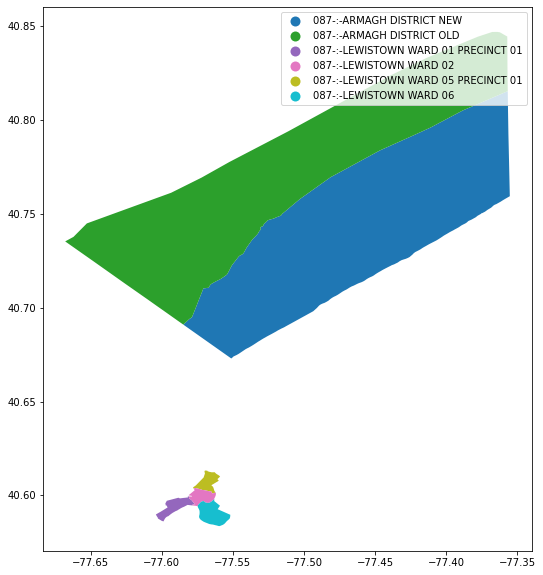

In [58]:
vest_pa_20[vest_pa_20["UNIQUE_ID"].isin(['087-:-ARMAGH DISTRICT OLD', '087-:-LEWISTOWN WARD 06',
                                        '087-:-LEWISTOWN WARD 05 PRECINCT 01', '087-:-ARMAGH DISTRICT NEW',
                                        '087-:-LEWISTOWN WARD 01 PRECINCT 01','087-:-LEWISTOWN WARD 02'])].plot(figsize = (10,10), column = "UNIQUE_ID", legend = True)

### Schuylkill - Names match up with the plots / locations

- ('107-:-CASS TWP SOUTH', '107-:-CASS PRECINCT 02')
- ('107-:-PINE GROVE NORTH', '107-:-PINE GROVE PRECINCT 01-000912')
- ('107-:-PINE GROVE SOUTH', '107-:-PINE GROVE PRECINCT 02-000922')
- ('107-:-CASS TWP NORTH', '107-:-CASS PRECINCT 01')

<AxesSubplot:>

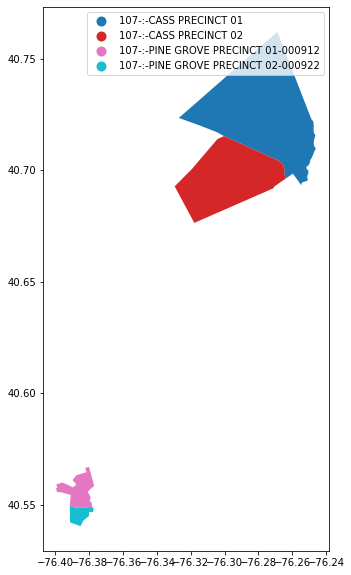

In [59]:
vest_pa_20[vest_pa_20["UNIQUE_ID"].isin(['107-:-CASS PRECINCT 02', '107-:-PINE GROVE PRECINCT 01-000912',
                                        '107-:-PINE GROVE PRECINCT 02-000922', '107-:-CASS PRECINCT 01'])].plot(figsize = (10,10), column = "UNIQUE_ID", legend = True)

In [60]:
official_st_vtds = gp.read_file("./raw-from-source/Shapefiles/Geography/WP_VotingDistricts.shp")
official_st_vtds["NAME_DETAILED"] = official_st_vtds["NAME20"] +" " + official_st_vtds['MCD_TYP_NM']
vtd_geoid_name_dict = dict(zip(official_st_vtds["GEOID20"],official_st_vtds["NAME_DETAILED"]))
vest_pa_20["VTD_ID"] = "42" + vest_pa_20["COUNTYFP"] + vest_pa_20["VTDST"].str.zfill(6)
vest_pa_20["VTD_NAME"] = vest_pa_20["VTD_ID"].map(vtd_geoid_name_dict).fillna(vest_pa_20["VTD_ID"])

In [61]:
official_st_vtds[official_st_vtds["NAME"].str.contains("LIVERPOOL")][["NAME20", "MCD_TYP_NM", "VTD"]]

,NAME20,MCD_TYP_NM,VTD
7001,LIVERPOOL,BOROUGH,000140
7002,LIVERPOOL,TOWNSHIP,000130


In [62]:
official_st_vtds[official_st_vtds["NAME"].str.contains("CASS")]

,FIPS,VTD,LEVEL_1,LEVEL_2,NAME,LOGRECNO,P0010001,P0010002,P0010003,P0010004,...,AWATER20,INTPTLAT20,INTPTLON20,COUNTY_NME,MCD_NUMBER,MCD_NAME,MCD_TYP_NM,MCD_TYP_CD,geometry,NAME_DETAILED
537,021,000250,None,None,CASSANDRA Voting District,75885,162,149,146,3,...,0,+40.4085558,-078.6407123,Cambria,11616,CASSANDRA,BOROUGH,6,"POLYGON ((-78.64361 40.40919, -78.64352 40.409...",CASSANDRA BOROUGH
3186,061,000070,None,None,CASS Voting District,77741,1018,991,982,9,...,0,+40.2888085,-078.0421490,Huntingdon,11600,CASS,TOWNSHIP,4,"POLYGON ((-78.12382 40.34261, -78.12373 40.342...",CASS TOWNSHIP
3187,061,000080,None,None,CASSVILLE Voting District,77742,135,131,131,0,...,0,+40.2928364,-078.0272305,Huntingdon,11632,CASSVILLE,BOROUGH,6,"POLYGON ((-78.03763 40.30438, -78.03689 40.304...",CASSVILLE BOROUGH
3693,107,000185,PRECINCT 02,None,CASS PRECINCT 02,81562,1363,1327,1297,17,...,23683,+40.6969250,-076.2943043,Schuylkill,11608,CASS,TOWNSHIP,4,"POLYGON ((-76.32952 40.69275, -76.32372 40.697...",CASS PRECINCT 02 TOWNSHIP
3694,107,000175,PRECINCT 01,None,CASS PRECINCT 01,81561,402,380,374,2,...,97202,+40.7359876,-076.2864145,Schuylkill,11608,CASS,TOWNSHIP,4,"POLYGON ((-76.32707 40.72346, -76.32002 40.728...",CASS PRECINCT 01 TOWNSHIP
6689,111,000100,None,None,CASSELMAN Voting District,81710,104,99,98,1,...,1494,+39.8854071,-079.2106505,Somerset,11624,CASSELMAN,BOROUGH,6,"POLYGON ((-79.21744 39.88718, -79.21605 39.887...",CASSELMAN BOROUGH


## Clean up Philadelphia Votes

Note: Need to drop the '101-:-TOTAL' precinct, as that just contains total votes
Also: Need to allocate the '101-:-FED-2', '101-:-FED-3', and '101-:-FED-5' precincts

In [63]:
pivoted_oe = pivoted_oe[pivoted_oe["UNIQUE_ID"]!="101-:-TOTAL"]
pivoted_oe.reset_index(inplace = True, drop = True)

In [64]:
print(pivoted_oe.shape)

(9151, 23)


In [65]:
to_allocate = pivoted_oe[pivoted_oe["UNIQUE_ID"].str.contains("FED-")]
pivoted_oe = pivoted_oe[~pivoted_oe["UNIQUE_ID"].str.contains("FED-")]

In [66]:
philly_precs = pivoted_oe[pivoted_oe["FIPS"]=="101"]
other_precs = pivoted_oe[pivoted_oe["FIPS"]!="101"]

In [67]:
print(to_allocate.shape)
print(philly_precs.shape)
print(other_precs.shape)

(3, 23)
(1703, 23)
(7445, 23)


In [68]:
philly_cols = []
# Make a smaller column list
for col in list(race_updates_dict.values()):
    if sum(philly_precs[col])>0 and col in list(vest_pa_20.columns):
        philly_cols.append(col)

In [69]:
philly_cols

['G20ATGLWAS',
 'G20ATGRHEI',
 'G20ATGDSHA',
 'G20ATGGWEI',
 'G20AUDLMOO',
 'G20AUDDAHM',
 'G20AUDGFAI',
 'G20AUDRDEF',
 'G20PRERTRU',
 'G20PRELJOR',
 'G20PREDBID',
 'G20TRELSOL',
 'G20TREDTOR',
 'G20TRERGAR',
 'G20TREGRUN']

In [70]:
## Note: Also need to do this for SLDL, CONG and SLDU (all races may not get votes)

In [71]:
philly_precs_allocated = pdv.allocate_absentee(philly_precs, to_allocate, philly_cols ,'FIPS', allocating_to_all_empty_precs=False)

In [72]:
pivoted_oe = pd.concat([philly_precs_allocated, other_precs])

In [73]:
pivoted_oe.reset_index(inplace = True, drop = True)

## Fix Various Election Result Typos

In [74]:
pivoted_oe.loc[pivoted_oe["UNIQUE_ID"]=='133-:-GOLDSBORO', 'G20AUDDAHM'] = 133
pivoted_oe.loc[pivoted_oe["UNIQUE_ID"]=='133-:-GOLDSBORO', 'G20AUDRDEF'] = 344
pivoted_oe.loc[pivoted_oe["UNIQUE_ID"]=='133-:-GOLDSBORO', 'G20AUDLMOO'] = 25
pivoted_oe.loc[pivoted_oe["UNIQUE_ID"]=='133-:-GOLDSBORO', 'G20AUDGFAI'] = 8
pivoted_oe.loc[pivoted_oe["UNIQUE_ID"]=='133-:-CHANCEFORD DISTRICT 01', 'G20TREDTOR'] = 306
pivoted_oe.loc[pivoted_oe["UNIQUE_ID"]=='133-:-CHANCEFORD DISTRICT 02', 'G20TREDTOR'] = 86
pivoted_oe.loc[pivoted_oe["UNIQUE_ID"]=='133-:-CHANCEFORD DISTRICT 03', 'G20TREDTOR'] = 173
pivoted_oe.loc[pivoted_oe["UNIQUE_ID"]=='131-:-LEMON', 'G20PREDBID'] = 203
pivoted_oe.loc[pivoted_oe["UNIQUE_ID"]=='131-:-FORKSTON', 'G20AUDGFAI'] = 1
pivoted_oe.loc[pivoted_oe["UNIQUE_ID"]=='131-:-TUNKHANNOCK DISTRICT 02', 'G20ATGLWAS'] = 13
pivoted_oe.loc[pivoted_oe["UNIQUE_ID"]=='021-:-CONEMAUGH DISTRICT CENTER', 'G20AUDRDEF'] = 468
pivoted_oe.loc[pivoted_oe["UNIQUE_ID"]=='021-:-JOHNSTOWN WARD 17 DIVISION 01', 'G20AUDGFAI'] = 13
pivoted_oe.loc[pivoted_oe["UNIQUE_ID"]=='021-:-JOHNSTOWN WARD 18', 'G20TRELSOL'] = 13
pivoted_oe.loc[pivoted_oe["UNIQUE_ID"]=='021-:-LORETTO', 'G20AUDRDEF'] = 115
pivoted_oe.loc[pivoted_oe["UNIQUE_ID"]=='021-:-LORETTO', 'G20AUDLMOO'] = 12
pivoted_oe.loc[pivoted_oe["UNIQUE_ID"]=='021-:-LORETTO', 'G20AUDGFAI'] = 3
pivoted_oe.loc[pivoted_oe["UNIQUE_ID"]=='021-:-WESTMONT DISTRICT 03', 'G20PREDBID'] = 445
pivoted_oe.loc[pivoted_oe["UNIQUE_ID"]=='021-:-WHITE', 'G20PREDBID'] = 126
pivoted_oe.loc[pivoted_oe["UNIQUE_ID"]=='021-:-WHITE', 'G20PRERTRU'] = 393
pivoted_oe.loc[pivoted_oe["UNIQUE_ID"]=='021-:-WHITE', 'G20PRELJOR'] = 4
pivoted_oe.loc[pivoted_oe["UNIQUE_ID"]=='039-:-TITUSVILLE WARD 05', 'G20AUDLMOO'] = 0
pivoted_oe.loc[pivoted_oe["UNIQUE_ID"]=='039-:-TITUSVILLE WARD 05', 'G20AUDGFAI'] = 1

In [75]:
join_attempt_one = pd.merge(vest_pa_20, pivoted_oe, how = "outer", on = "UNIQUE_ID", indicator = True, validate="1:1")
join_attempt_one["_merge"].value_counts()

both          9148
left_only        2
right_only       0
Name: _merge, dtype: int64

In [76]:
# Note, these precincts don't contain any votes
pd.options.display.max_columns = 999

join_attempt_one[join_attempt_one["_merge"]=="left_only"]

,STATEFP,COUNTYFP,VTDST,NAME,G20PREDBID_x,G20PRERTRU_x,G20PRELJOR_x,G20ATGDSHA_x,G20ATGRHEI_x,G20ATGLWAS_x,G20ATGGWEI_x,G20AUDDAHM_x,G20AUDRDEF_x,G20AUDLMOO_x,G20AUDGFAI_x,G20TREDTOR_x,G20TRERGAR_x,G20TRELSOL_x,G20TREGRUN_x,geometry,Precinct_Detailed,UNIQUE_ID,VTD_ID,VTD_NAME,FIPS,precinct,G20ATGLWAS_y,G20ATGRHEI_y,G20ATGDSHA_y,G20ATGGWEI_y,G20ATGOWRI,G20AUDLMOO_y,G20AUDDAHM_y,G20AUDGFAI_y,G20AUDRDEF_y,G20AUDOWRI,G20PRERTRU_y,G20PREGHAW,G20PRELJOR_y,G20PREDBID_y,G20PREOWRI,G20TRELSOL_y,G20TREDTOR_y,G20TRERGAR_y,G20TREGRUN_y,G20TREOWRI,_merge
853,42,011,1578P1,ADAMSTOWN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,"POLYGON Z ((-76.04949 40.25063 0.00000, -76.04...",011-1578P1,011-:-ADAMSTOWN,420111578P1,ADAMSTOWN BOROUGH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
8734,42,049,999999,LAKE ERIE,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,"POLYGON Z ((-80.07205 42.15547 0.00000, -80.07...",049-999999,049-:-LAKE ERIE,42049999999,LAKE ERIE TOWNSHIP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only


In [77]:
join_attempt_one_merged = join_attempt_one[join_attempt_one["_merge"]=="both"]

## Various Vote Total Checks

In [78]:
statewide_columns = [i for i in vest_pa_20.columns if "G20" in i]

## Statewide Votes Check

In [79]:
pdv.statewide_totals_check(vest_pa_20, "VEST", pivoted_oe, "Open Elections", cand_columns)

***Statewide Totals Check***
G20PREDBID has a difference of 165 votes
	VEST: 3460475 votes
	Open Elections: 3460310 votes
G20PRERTRU has a difference of 346 votes
	VEST: 3378442 votes
	Open Elections: 3378096 votes
G20PRELJOR has a difference of 10 votes
	VEST: 79432 votes
	Open Elections: 79422 votes
G20ATGDSHA has a difference of 126 votes
	VEST: 3457757 votes
	Open Elections: 3457631 votes
G20ATGRHEI has a difference of 331 votes
	VEST: 3150425 votes
	Open Elections: 3150094 votes
G20ATGLWAS has a difference of 10 votes
	VEST: 120177 votes
	Open Elections: 120167 votes
G20ATGGWEI has a difference of 4 votes
	VEST: 70641 votes
	Open Elections: 70637 votes
G20AUDDAHM has a difference of 107 votes
	VEST: 3125751 votes
	Open Elections: 3125644 votes
G20AUDRDEF has a difference of 327 votes
	VEST: 3334394 votes
	Open Elections: 3334067 votes
G20AUDLMOO has a difference of 24 votes
	VEST: 205552 votes
	Open Elections: 205528 votes
G20AUDGFAI has a difference of 3 votes
	VEST: 78396 votes


## County-Level Votes Check

In [80]:
pivoted_oe["COUNTYFP"] = pivoted_oe["FIPS"]

In [81]:
pdv.county_totals_check(vest_pa_20, "VEST", pivoted_oe, "Open Elections", cand_columns, "COUNTYFP")

***Countywide Totals Check***

G20PREDBID contains differences in these counties:
	053 has a difference of 13 votes
		VEST: 728 votes
		Open Elections: 715 votes
	115 has a difference of 152 votes
		VEST: 6236 votes
		Open Elections: 6084 votes
G20PRERTRU contains differences in these counties:
	039 has a difference of 1 votes
		VEST: 28561 votes
		Open Elections: 28560 votes
	053 has a difference of 18 votes
		VEST: 1882 votes
		Open Elections: 1864 votes
	055 has a difference of -1 votes
		VEST: 57245 votes
		Open Elections: 57246 votes
	115 has a difference of 328 votes
		VEST: 15207 votes
		Open Elections: 14879 votes
G20PRELJOR contains differences in these counties:
	053 has a difference of 2 votes
		VEST: 36 votes
		Open Elections: 34 votes
	115 has a difference of 8 votes
		VEST: 309 votes
		Open Elections: 301 votes
G20ATGDSHA contains differences in these counties:
	053 has a difference of 8 votes
		VEST: 859 votes
		Open Elections: 851 votes
	115 has a difference of 118 vote

## Precinct-Level Votes Check

In [82]:
all_oe_races[all_oe_races["FIPS"]=="131"]

,county,precinct,office,district,candidate,party,votes,absentee,election_day,FIPS,cand_detailed,UNIQUE_ID
422438,Wyoming,BRAINTRIM TOWNSHIP,President,NaN,JOSEPH R. BIDEN,DEM,51,0.0,51,131,President-:-JOSEPH R. BIDEN-:-DEM,131-:-BRAINTRIM TOWNSHIP
422439,Wyoming,BRAINTRIM TOWNSHIP,President,NaN,DONALD J. TRUMP,REP,179,0.0,179,131,President-:-DONALD J. TRUMP-:-REP,131-:-BRAINTRIM TOWNSHIP
422440,Wyoming,BRAINTRIM TOWNSHIP,President,NaN,JO JORGENSEN,LIB,0,0.0,0,131,President-:-JO JORGENSEN-:-LIB,131-:-BRAINTRIM TOWNSHIP
422441,Wyoming,CLINTON TOWNSHIP,President,NaN,JOSEPH R. BIDEN,DEM,315,0.0,315,131,President-:-JOSEPH R. BIDEN-:-DEM,131-:-CLINTON TOWNSHIP
422442,Wyoming,CLINTON TOWNSHIP,President,NaN,DONALD J. TRUMP,REP,472,0.0,472,131,President-:-DONALD J. TRUMP-:-REP,131-:-CLINTON TOWNSHIP
...,...,...,...,...,...,...,...,...,...,...,...,...
422853,Wyoming,WASHINGTON TOWNSHIP,State Treasurer,NaN,TIMOTHY RUNKLE,GRN,7,0.0,7,131,State Treasurer-:-TIMOTHY RUNKLE-:-GRN,131-:-WASHINGTON TOWNSHIP
422854,Wyoming,WINDHAM TOWNSHIP,State Treasurer,NaN,JOE TORSELLA,DEM,81,0.0,81,131,State Treasurer-:-JOE TORSELLA-:-DEM,131-:-WINDHAM TOWNSHIP
422855,Wyoming,WINDHAM TOWNSHIP,State Treasurer,NaN,STACY L GARRITY,REP,324,0.0,324,131,State Treasurer-:-STACY L GARRITY-:-REP,131-:-WINDHAM TOWNSHIP
422856,Wyoming,WINDHAM TOWNSHIP,State Treasurer,NaN,JOE SOLOSKI,LIB,4,0.0,4,131,State Treasurer-:-JOE SOLOSKI-:-LIB,131-:-WINDHAM TOWNSHIP


In [83]:
for col in cand_columns:
    join_attempt_one_merged.loc[:,col+"_x"] = join_attempt_one_merged[col+"_x"].fillna(0)
    join_attempt_one_merged.loc[:,col+"_y"] = join_attempt_one_merged[col+"_y"].fillna(0)

/var/folders/1t/0q4w6hm92mg_zxd84dfxmq3m0000gn/T/ipykernel_65605/1062066695.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  join_attempt_one_merged.loc[:,col+"_x"] = join_attempt_one_merged[col+"_x"].fillna(0)
/var/folders/1t/0q4w6hm92mg_zxd84dfxmq3m0000gn/T/ipykernel_65605/1062066695.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  join_attempt_one_merged.loc[:,col+"_y"] = join_attempt_one_merged[col+"_y"].fillna(0)


In [130]:
pdv.precinct_votes_check(join_attempt_one_merged, cand_columns, True , "UNIQUE_ID",print_level=0)

G20PRERTRU ...................................................039-:-WOODCOCK-000660 (V) .1048  (S).1047 (D):    1
G20ATGRHEI ...................................................039-:-WOODCOCK-000660 (V) ..983  (S)..982 (D):    1
G20AUDRDEF ...................................................039-:-WOODCOCK-000660 (V) .1021  (S).1020 (D):    1
G20TRERGAR ...................................................039-:-WOODCOCK-000660 (V) ..999  (S)..998 (D):    1
G20PRELJOR .............................................................053-:-GREEN (V) ....4  (S)....3 (D):    1
G20ATGDSHA .............................................................053-:-GREEN (V) ...75  (S)...74 (D):    1
G20AUDLMOO .............................................................053-:-GREEN (V) ....8  (S)....7 (D):    1
G20TRELSOL .............................................................053-:-GREEN (V) ....7  (S)....6 (D):    1
G20PRERTRU ...........................................................053-:-HARMONY (V) 

G20PREDBID ..................................101-:-PHILADELPHIA WARD 36 PRECINCT 40 (V) ..625  (S)..624 (D):    1
G20PREDBID ..................................101-:-PHILADELPHIA WARD 37 PRECINCT 03 (V) ..168  (S)..169 (D):   -1
G20PREDBID ..................................101-:-PHILADELPHIA WARD 37 PRECINCT 06 (V) ..161  (S)..162 (D):   -1
G20PREDBID ..................................101-:-PHILADELPHIA WARD 37 PRECINCT 17 (V) ..190  (S)..191 (D):   -1
G20PREDBID ..................................101-:-PHILADELPHIA WARD 38 PRECINCT 09 (V) ..748  (S)..746 (D):    2
G20PREDBID ..................................101-:-PHILADELPHIA WARD 38 PRECINCT 12 (V) ..461  (S)..462 (D):   -1
G20PREDBID ..................................101-:-PHILADELPHIA WARD 39 PRECINCT 02 (V) ..185  (S)..186 (D):   -1
G20PRERTRU ..................................101-:-PHILADELPHIA WARD 39 PRECINCT 03 (V) ..245  (S)..246 (D):   -1
G20PREDBID ..................................101-:-PHILADELPHIA WARD 39 PRECINCT 06 (V) 

G20PREDBID ..........................................................115-:-APOLACON (V) ...66  (S)...63 (D):    3
G20PRERTRU ..........................................................115-:-APOLACON (V) ..229  (S)..216 (D):   13
G20ATGDSHA ..........................................................115-:-APOLACON (V) ...71  (S)...69 (D):    2
G20ATGRHEI ..........................................................115-:-APOLACON (V) ..203  (S)..198 (D):    5
G20AUDDAHM ..........................................................115-:-APOLACON (V) ...59  (S)...57 (D):    2
G20AUDRDEF ..........................................................115-:-APOLACON (V) ..205  (S)..200 (D):    5
G20TREDTOR ..........................................................115-:-APOLACON (V) ...63  (S)...61 (D):    2
G20TRERGAR ..........................................................115-:-APOLACON (V) ..209  (S)..204 (D):    5
G20PRERTRU ............................................................115-:-ARARAT (V) 


There are  9148  total rows
460  of these rows have election result differences
8688  of these rows are the same

The max difference between any one shared column in a row is:  34.0
The average difference is:  2.902877697841727
There are  53 precinct results with a difference greater than 10

All precincts containing differences:
['039-:-WOODCOCK-000660', '053-:-GREEN', '053-:-HARMONY', '053-:-HICKORY', '053-:-HOWE', '053-:-JENKS', '053-:-KINGSLEY', '053-:-TIONESTA-000100', '053-:-TIONESTA-000110', '055-:-GREENE DISTRICT 05', '101-:-PHILADELPHIA WARD 02 PRECINCT 07', '101-:-PHILADELPHIA WARD 02 PRECINCT 22', '101-:-PHILADELPHIA WARD 02 PRECINCT 23', '101-:-PHILADELPHIA WARD 02 PRECINCT 28', '101-:-PHILADELPHIA WARD 02 PRECINCT 29', '101-:-PHILADELPHIA WARD 03 PRECINCT 18', '101-:-PHILADELPHIA WARD 04 PRECINCT 15', '101-:-PHILADELPHIA WARD 04 PRECINCT 16', '101-:-PHILADELPHIA WARD 05 PRECINCT 02', '101-:-PHILADELPHIA WARD 05 PRECINCT 03', '101-:-PHILADELPHIA WARD 05 PRECINCT 04', '101-

## Differences Explanation

In [85]:
# Susquehanna (115) FIPS, VEST uses a different source file
# Forest (053) FIPS, VEST uses a different source file
# Franklin, counting a "write-in Donald trump" as a trump vote
# Philadelphia (101) FIPS, slight differences in allocation

## Join Election Results to a Shapefile

In [86]:
official_pa_blocks["UNIQUE_ID"] = official_pa_blocks["FIPS"]+"-:-"+official_pa_blocks["NAME"]

In [87]:
ser = official_pa_blocks["UNIQUE_ID"].value_counts()
dup_ids = ser[ser > 1]
official_pa_blocks.loc[official_pa_blocks["UNIQUE_ID"].isin(list(dup_ids.index)), "UNIQUE_ID"] = official_pa_blocks["UNIQUE_ID"] + " " + official_pa_blocks["MCD_TYP_NM"]

In [88]:
official_pa_blocks["UNIQUE_ID"] = official_pa_blocks["UNIQUE_ID"].str.replace(" Voting District", "")

In [89]:
official_pa_blocks["UNIQUE_ID"].value_counts(dropna = False)

001-:-ABBOTTSTOWN                   1
095-:-LOWER NAZARETH DISTRICT 02    1
095-:-LEHIGH DISTRICT NORTHWEST     1
095-:-LEHIGH DISTRICT PENNSVILLE    1
095-:-LEHIGH DISTRICT TREICHLERS    1
                                   ..
037-:-SUGARLOAF                     1
037-:-STILLWATER                    1
037-:-SOUTH CENTRE                  1
037-:-SCOTT DISTRICT WEST           1
133-:-YORKANA                       1
Name: UNIQUE_ID, Length: 9153, dtype: int64

In [90]:
elections_shapes_join = pd.merge(official_pa_blocks, pivoted_oe, how = "outer", on = "UNIQUE_ID", indicator = True)
elections_shapes_join["_merge"].value_counts()

both          8407
left_only      746
right_only     741
Name: _merge, dtype: int64

In [91]:
shape_elections_changes = pd.read_csv("./shape_elections_join_changes.csv")
shape_elections_changes_dict = dict(zip(shape_elections_changes["shp_ID"], shape_elections_changes["election_ID"]))

official_pa_blocks["UNIQUE_ID"] = official_pa_blocks["UNIQUE_ID"].map(shape_elections_changes_dict).fillna(official_pa_blocks["UNIQUE_ID"])

In [92]:
elections_shapes_join = pd.merge(official_pa_blocks, pivoted_oe, how = "outer", on = "UNIQUE_ID", indicator = True)
elections_shapes_join["_merge"].value_counts()

both          9140
left_only       13
right_only       8
Name: _merge, dtype: int64

In [93]:
elections_shapes_join[elections_shapes_join["_merge"]=="left_only"]["UNIQUE_ID"]

1806                                  011-:-ADAMSTOWN
1900                                 013-:-TUNNELHILL
2631             029-:-BIRMINGHAM PRECINCT 02 (CD 05)
2632             029-:-BIRMINGHAM PRECINCT 02 (CD 06)
2899                                   031-:-EMLENTON
3046                                    037-:-ASHLAND
3997                                  049-:-LAKE ERIE
4075                              051-:-SEVEN SPRINGS
4665              071-:-LANCASTER WARD 07 PRECINCT 08
5702    091-:-HORSHAM DISTRICT 04 DIVISION 02 (CD 01)
5703    091-:-HORSHAM DISTRICT 04 DIVISION 02 (CD 04)
6257                         099-:-NORTH EAST MADISON
6262                         099-:-SOUTH WEST MADISON
Name: UNIQUE_ID, dtype: object

In [94]:
elections_shapes_join[elections_shapes_join["_merge"]=="right_only"]["UNIQUE_ID"]

9153                    029-:-BIRMINGHAM PRECINCT 02
9154             041-:-LOWER ALLEN PRECINCT 01 ANNEX
9155        071-:-LANCASTER WARD 07 PRECINCT 08 (CV)
9156        071-:-LANCASTER WARD 07 PRECINCT 08 (LS)
9157    077-:-ALLENTOWN WARD 17 DISTRICT 04 PARKLAND
9158           091-:-HORSHAM DISTRICT 04 DIVISION 02
9159                                   099-:-MADISON
9160                                099-:-SANDY HILL
Name: UNIQUE_ID, dtype: object

In [95]:
elections_shapes_join[elections_shapes_join["_merge"]=="left_only"].drop(["geometry"],axis=1).to_csv("./left_only_ep.csv")
elections_shapes_join[elections_shapes_join["_merge"]=="right_only"].to_csv("./right_only_ep.csv")

In [96]:
final_source_join = elections_shapes_join[elections_shapes_join["_merge"]=="both"]
final_source_join.drop("_merge", axis = 1, inplace = True)

/var/folders/1t/0q4w6hm92mg_zxd84dfxmq3m0000gn/T/ipykernel_65605/408154011.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_source_join.drop("_merge", axis = 1, inplace = True)


Non-unique merge values
     STATEFP COUNTYFP_x   VTDST                                  NAME_x  \
853       42        011  1578P1                               ADAMSTOWN   
1305      42        029  000037                  BIRMINGHAM PRECINCT 02   
3461      42        099  000260                                 MADISON   
3463      42        099  000210                              SANDY HILL   
5687      42        041  000340           LOWER ALLEN PRECINCT 01 ANNEX   
6253      42        071  000925      LANCASTER WARD 07 PRECINCT 08 (LS)   
6254      42        071  000925      LANCASTER WARD 07 PRECINCT 08 (CV)   
8734      42        049  999999                               LAKE ERIE   
9147      42        091  001143         HORSHAM DISTRICT 04 DIVISION 02   
9149      42        077  000490  ALLENTOWN WARD 17 DISTRICT 04 PARKLAND   

      G20PREDBID_x  G20PRERTRU_x  G20PRELJOR_x  G20ATGDSHA_x  G20ATGRHEI_x  \
853              0             0             0             0            

Checking 9140 precinct for differences of greater than 0.1 km^2

1) For 005-:-COWANSHANNOCK DISTRICT WESTERN difference in area is 0.5728883720018447
2) For 013-:-GREENFIELD DISTRICT 02 difference in area is 6.123148894972061
3) For 021-:-CHEST difference in area is 0.20288981932932207
4) For 021-:-LILLY WARD 01 difference in area is 0.22922286784284082
5) For 021-:-LILLY WARD 02 difference in area is 0.22942387649479196
6) For 021-:-READE difference in area is 0.13088638122676285
7) For 033-:-CHEST difference in area is 0.1944494296346289
8) For 047-:-JONES DISTRICT WILCOX difference in area is 0.3845575764526123
9) For 051-:-SPRINGFIELD DISTRICT 02 difference in area is 0.10080776688750748
10) For 059-:-MONONGAHELA DISTRICT 02 difference in area is 7.90404376797048
11) For 063-:-EAST WHEATFIELD DISTRICT 02 difference in area is 0.13943511571575753
12) For 067-:-DELAWARE difference in area is 0.22225448106898948
13) For 067-:-FAYETTE difference in area is 0.2222587296622111
14) For 07

/Users/peterhorton/opt/anaconda3/envs/geo_env/lib/python3.9/site-packages/geopandas/plotting.py:661: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


22) For 111-:-LOWER TURKEYFOOT difference in area is 0.1470575403101958
23) For 111-:-OGLE difference in area is 0.10008454760303723
24) For 023-:-SHIPPEN DISTRICT EAST difference in area is 8.164829039504976
25) For 023-:-SHIPPEN DISTRICT WEST difference in area is 8.252127632358862
26) For 047-:-RIDGWAY DISTRICT SOUTH difference in area is 1.8033820840511319
27) For 047-:-RIDGWAY DISTRICT NORTH difference in area is 1.803382084051441
28) For 047-:-ST. MARYS WARD 06 difference in area is 0.9409438499549072
29) For 047-:-ST. MARYS WARD 05 difference in area is 0.8842279149386512
30) For 047-:-ST. MARYS WARD 02 difference in area is 0.33886769868382055
31) For 047-:-ST. MARYS WARD 03 difference in area is 0.3175449241148929
32) For 031-:-HIGHLAND difference in area is 0.16829127386619133
33) For 031-:-FARMINGTON DISTRICT CENTRAL difference in area is 0.1891358087337909
34) For 073-:-NESHANNOCK DISTRICT 04 difference in area is 0.1673140424108346
35) For 123-:-CONEWANGO PRECINCT 01 diffe

129) For 013-:-ANTIS DISTRICT 02 difference in area is 1.660384123430134
130) For 013-:-ANTIS DISTRICT 03 difference in area is 0.9254790895415533
131) For 013-:-BLAIR DISTRICT 02 difference in area is 0.10367244543930919
132) For 013-:-FREEDOM DISTRICT 01 difference in area is 0.5183276426528756
133) For 013-:-GREENFIELD DISTRICT 01 difference in area is 6.063950583766966
134) For 013-:-FREEDOM DISTRICT 02 difference in area is 0.5479484485341403
135) For 013-:-FRANKSTOWN DISTRICT 01 difference in area is 0.6139701238168362
136) For 013-:-FRANKSTOWN DISTRICT 04 difference in area is 0.24243208890473825
137) For 013-:-FRANKSTOWN DISTRICT 05 difference in area is 0.8205672950694435
138) For 013-:-ANTIS DISTRICT 01 difference in area is 1.0332725913405827
139) For 013-:-ALLEGHENY DISTRICT 03 difference in area is 0.12367838149774947
140) For 013-:-ALTOONA WARD 05 PRECINCT 01 difference in area is 0.10876124049886002
141) For 013-:-ALTOONA WARD 05 PRECINCT 03 difference in area is 0.10821

235) For 125-:-CROSS CREEK DISTRICT 02 difference in area is 0.44153884105931807
236) For 125-:-ROBINSON DISTRICT 01 difference in area is 0.2193077645481755
237) For 125-:-MOUNT PLEASANT DISTRICT 02 difference in area is 0.14660624212735965
238) For 125-:-MOUNT PLEASANT DISTRICT 03 difference in area is 0.5440624638351693
239) For 125-:-MOUNT PLEASANT DISTRICT 04 difference in area is 0.1208419887985444
240) For 125-:-CANTON DISTRICT 02 difference in area is 0.18527130895071478
241) For 125-:-CANTON DISTRICT 01 difference in area is 0.6354426227742236
242) For 125-:-WEST PIKE RUN DISTRICT 01 difference in area is 0.36655085543389365
243) For 125-:-WEST PIKE RUN DISTRICT 02 difference in area is 0.3655511974164911
244) For 125-:-CENTERVILLE DISTRICT 05 difference in area is 0.12780154358671475
245) For 125-:-CENTERVILLE DISTRICT 01 difference in area is 0.36817261428055975
246) For 125-:-CENTERVILLE DISTRICT 06 difference in area is 0.21408982459956413
247) For 125-:-LONG BRANCH differ

338) For 129-:-SALEM DISTRICT FIVE POINTS difference in area is 0.2412397341142653
339) For 129-:-SALEM DISTRICT TREES MILLS difference in area is 0.377214279786021
340) For 129-:-SALEM DISTRICT STEELES difference in area is 0.15243523740185078
341) For 129-:-SALEM DISTRICT NEW SALEM difference in area is 0.4851551736968862
342) For 129-:-ROSTRAVER DISTRICT VAN METER difference in area is 0.23706989987566307
343) For 129-:-ROSTRAVER DISTRICT CONCORD difference in area is 0.3411020376221002
344) For 129-:-SOUTH HUNTINGDON DISTRICT WYANO difference in area is 0.25022817231715705
345) For 129-:-SOUTH HUNTINGDON DISTRICT YUKON difference in area is 0.30567169893961194
346) For 129-:-SOUTH HUNTINGDON DISTRICT MINERAL difference in area is 0.4046237896613332
347) For 129-:-EAST HUNTINGDON DISTRICT STONERS difference in area is 0.4077027303366294
348) For 129-:-EAST HUNTINGDON DISTRICT BESSEMER DIVISION 01 difference in area is 0.199912509633061
349) For 129-:-EAST HUNTINGDON DISTRICT BESSEME

440) For 125-:-SMITH DISTRICT 05 difference in area is 0.14362117580281528
441) For 051-:-GERMAN DISTRICT 02 difference in area is 0.1589297264764564
442) For 051-:-GEORGES DISTRICT 02 difference in area is 1.260095118755025
443) For 051-:-DUNBAR DISTRICT 01 difference in area is 0.1591962357398804
444) For 051-:-DUNBAR DISTRICT 02 difference in area is 0.14697900085696552
445) For 051-:-REDSTONE DISTRICT 01 difference in area is 0.3367433894816616
446) For 097-:-RALPHO DISTRICT 02 difference in area is 0.49064253314744644
447) For 097-:-UPPER AUGUSTA DISTRICT NORTHWEST difference in area is 2.062627751760093
448) For 097-:-UPPER AUGUSTA DISTRICT NORTHEAST difference in area is 2.0626277516549734
449) For 097-:-POINT DISTRICT WEST difference in area is 0.5653358675331516
450) For 097-:-RALPHO DISTRICT 01 difference in area is 0.49064253312783335
451) For 097-:-POINT DISTRICT EAST difference in area is 0.5653358684960078
452) For 129-:-LIGONIER DISTRICT LAUGHLINSTOWN difference in area 

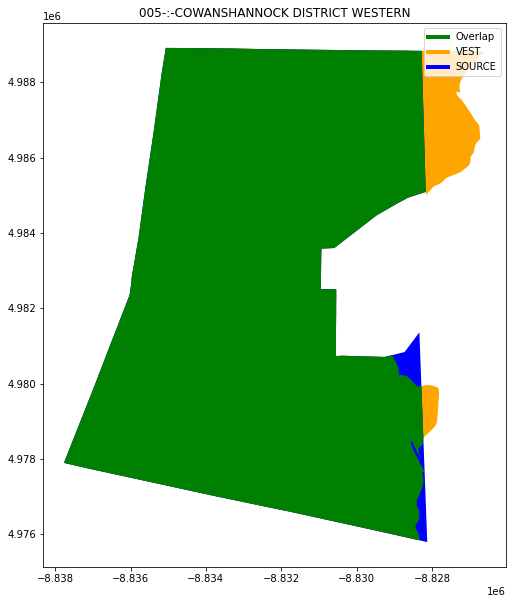

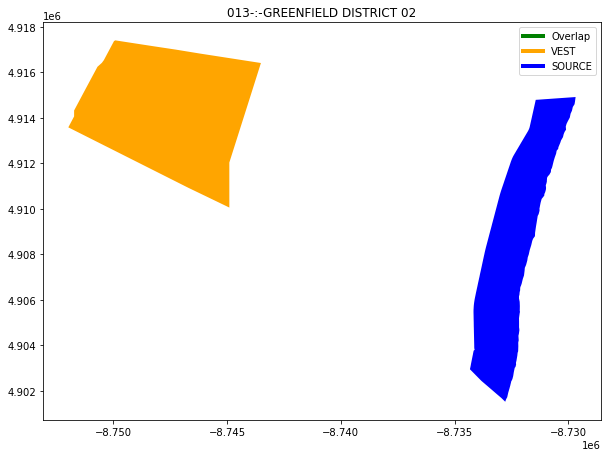

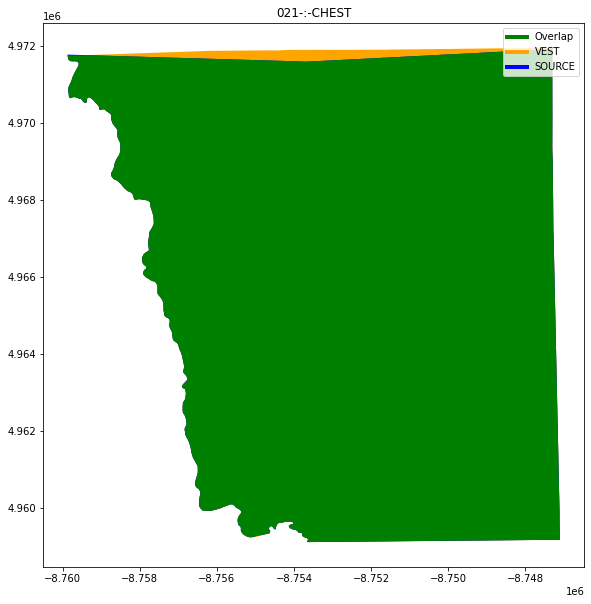

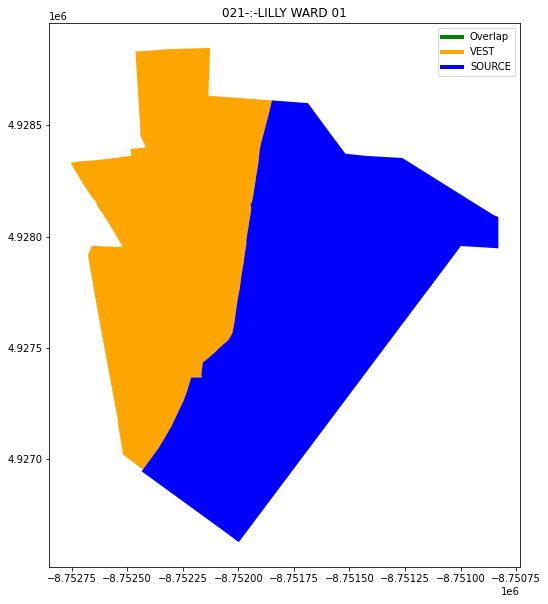

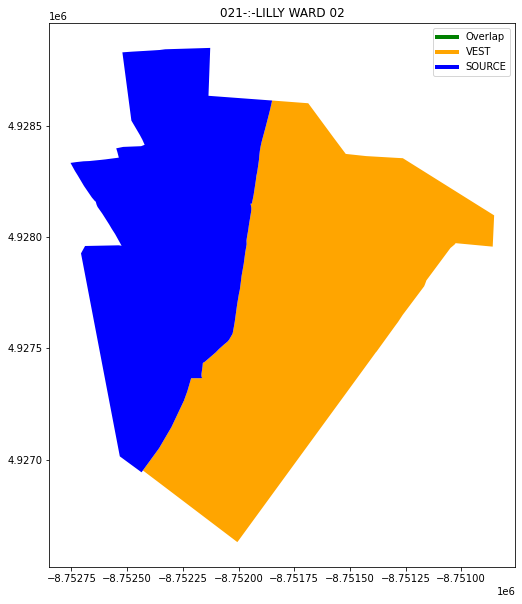

...

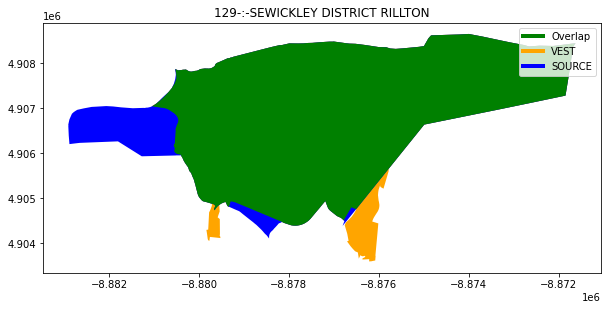

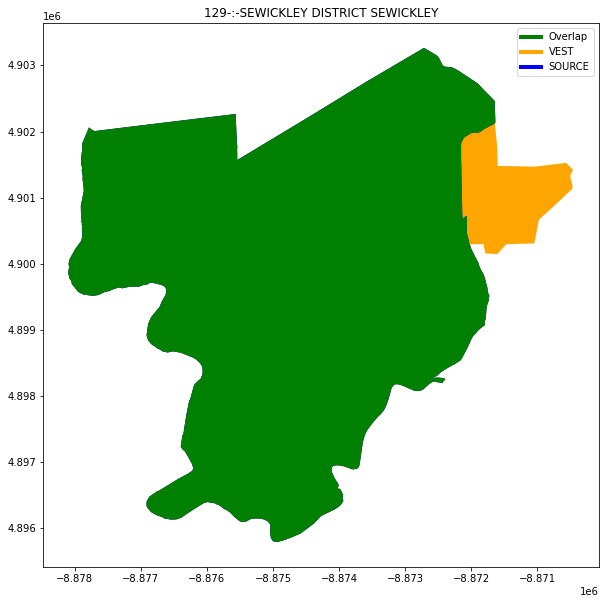

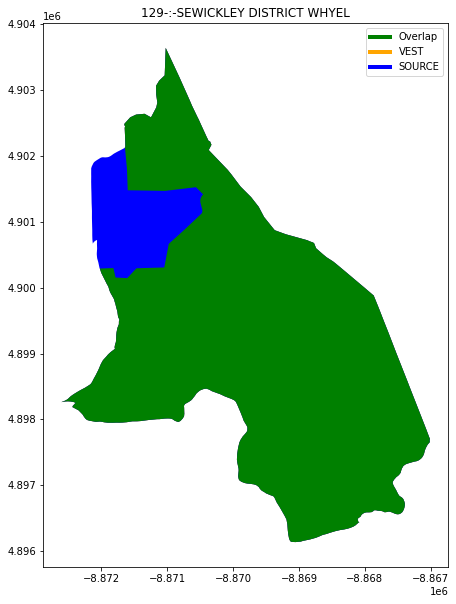

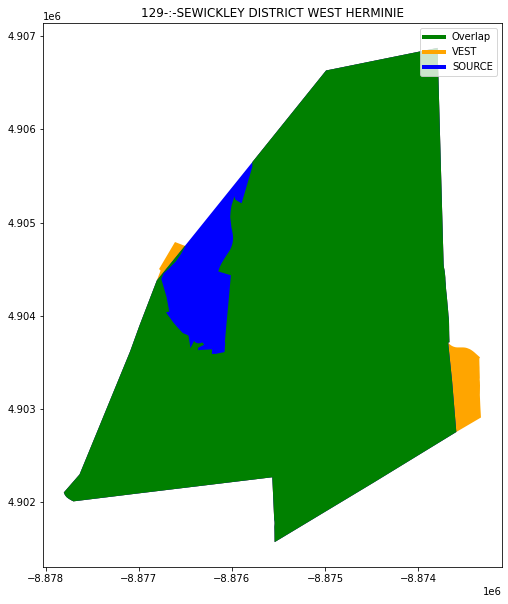

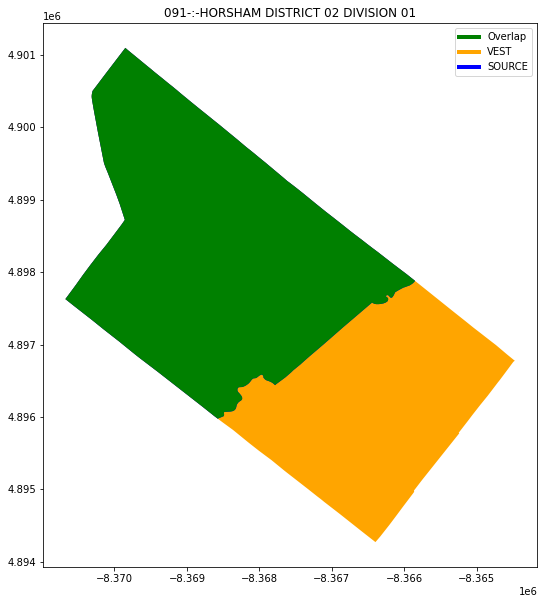

In [97]:
pdv.compare_geometries(vest_pa_20,final_source_join,"VEST","SOURCE","UNIQUE_ID", "precinct", area_threshold=.1)

VEST mentions in docs
- 003 Elizabeth Ward 06 District 01
- 003 Elizabeth Ward 01 District 02
- 013 Blair County - Greenfield District 2
- 013 Blair County - Greenfield District 1
- 015 Athens District 1
- 015 Athens District 2
- 059 Monongahela
- 059-:-DUNKARD District 01
- 059-:-DUNKARD District 02
- 125 Somerset District 01
- 125 Somerset District 02
- 125 New Eagle District 01
- 125 New Eagle District 02
- 133 Fairview District 04
- 133 Fairview District 02
- 133 Fairview District 01
- 133 Fairview District 03

Cambria - Contradicts what is here, which is a 2022 map: https://cambriapa.maps.arcgis.com/home/webmap/viewer.html?webmap=4b9110140ccb4db3adce5038264ddbfa&extent=-79.0482,40.3108,-78.3753,40.7284
- 021 Lily Ward 01 
- 021 Lily Ward 02 
- 021 Johnstown Ward 20 Division 02
- 021 Upper Yoder District 04
- 021 Jackson District 03

Blair - Contradicts what is here:
http://www.blairco.org/Dept/Elections/PrecinctMaps/ALTOONA_All.pdf
- 013 Altoona Ward 05 Precinct 03
- 013 Altoona Ward 05 Precinct 01


VEST looks right here
- 045 Brookhaven PCT 03, polling location should be Full Gospel Assembly
- 045 Brookhaven PCT 05







# Compare Against "Official" Election Results

## Compare VEST Against State Totals

Note: We downloaded these from this link: (https://www.electionreturns.pa.gov/)

In [98]:
# Load in Official State Totals
official_county_pa = pd.read_csv("./raw-from-source/Official_4192022114153AM.CSV")

In [99]:
official_county_pa = pd.pivot_table(official_county_pa, index = "County Name", columns = "Candidate Name", values = "Votes", aggfunc = sum)

In [100]:
official_county_pa.reset_index(inplace = True, drop = False)

In [101]:
cand_rename_dict = {
    'AHMAD, NILOFER NINA':'G20AUDDAHM',
    'BIDEN, JOSEPH ROBINETTE JR':'G20PREDBID',
    'DEFOOR, TIMOTHY  L':'G20AUDRDEF',
    'FAISON, OLIVIA':'G20AUDGFAI', 
    'GARRITY, STACY L':'G20TRERGAR',
    'HEIDELBAUGH, HEATHER S':'G20ATGRHEI',
    'JORGENSEN, JO':'G20PRELJOR', 
    'MOORE, JENNIFER LYNN':'G20AUDLMOO',
    'RUNKLE, TIMOTHY':'G20TREGRUN',
    'SHAPIRO , JOSHUA D':'G20ATGDSHA', 
    'SOLOSKI, JOSEPH P':'G20TRELSOL',
    'TORSELLA, JOSEPH M':'G20TREDTOR',
    'TRUMP, DONALD J.':'G20PRERTRU', 
    'WASSMER, DANIEL':'G20ATGLWAS',
    'WEISS, RICHARD L':'G20ATGGWEI'
}

official_county_pa.rename(columns = cand_rename_dict, inplace = True)

In [102]:
for val in cand_columns:
    official_county_pa[val] = official_county_pa[val].str.replace(",","")
    official_county_pa[val] = official_county_pa[val].astype(int)

In [103]:
pdv.statewide_totals_check(vest_pa_20, "VEST", official_county_pa, "Official PA", cand_columns)

***Statewide Totals Check***
G20PREDBID has a difference of 2246 votes
	VEST: 3460475 votes
	Official PA: 3458229 votes
G20PRERTRU has a difference of 768 votes
	VEST: 3378442 votes
	Official PA: 3377674 votes
G20PRELJOR has a difference of 52 votes
	VEST: 79432 votes
	Official PA: 79380 votes
G20ATGDSHA has a difference of -3715 votes
	VEST: 3457757 votes
	Official PA: 3461472 votes
G20ATGRHEI has a difference of -3406 votes
	VEST: 3150425 votes
	Official PA: 3153831 votes
G20ATGLWAS has a difference of -312 votes
	VEST: 120177 votes
	Official PA: 120489 votes
G20ATGGWEI has a difference of -163 votes
	VEST: 70641 votes
	Official PA: 70804 votes
G20AUDDAHM has a difference of -3380 votes
	VEST: 3125751 votes
	Official PA: 3129131 votes
G20AUDRDEF has a difference of -3615 votes
	VEST: 3334394 votes
	Official PA: 3338009 votes
G20AUDLMOO has a difference of -377 votes
	VEST: 205552 votes
	Official PA: 205929 votes
G20AUDGFAI has a difference of -192 votes
	VEST: 78396 votes
	Official P

## Compare VEST Against County Totals

In [104]:
official_county_pa

Candidate Name,County Name,G20AUDDAHM,G20PREDBID,G20AUDRDEF,G20AUDGFAI,G20TRERGAR,G20ATGRHEI,G20PRELJOR,G20AUDLMOO,G20TREGRUN,G20ATGDSHA,G20TRELSOL,G20TREDTOR,G20PRERTRU,G20ATGLWAS,G20ATGGWEI
0,ADAMS,15859,18207,37076,609,37087,36476,810,2010,795,17707,1385,16418,37523,1183,518
1,ALLEGHENY,397204,429065,275870,9967,270964,246537,8344,21166,10711,443523,17176,404138,282324,13619,9236
2,ARMSTRONG,8231,8457,26089,277,25875,24569,424,1213,262,10673,1009,8756,27489,609,242
3,BEAVER,36281,38122,52045,1096,51292,47316,1241,3562,1106,43446,2421,38214,54759,1817,897
4,BEDFORD,3801,4367,22524,169,22272,22088,182,623,167,4743,383,4351,23025,312,134
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62,WASHINGTON,42029,45088,69587,1112,68257,63881,1310,3705,1101,50617,2827,44477,72080,2081,909
63,WAYNE,8228,9191,17929,335,18233,17302,261,887,317,9632,547,8363,18637,422,265
64,WESTMORELAND,68478,72129,125237,1768,123694,115208,2350,6029,1815,83550,4358,71908,130218,3363,1436
65,WYOMING,4167,4704,9653,206,9751,9159,218,492,172,5080,324,4270,9936,258,163


In [105]:
# Add in a COUNTY FIPS
fips_dict = pdv.get_fips_dict("Pennsylvania")
official_county_pa["County Name"] = official_county_pa["County Name"].str.title()
official_county_pa["County Name"] = official_county_pa["County Name"].map({"Mckean":"McKean"}).fillna(official_county_pa["County Name"])


official_county_pa["COUNTYFP"] = official_county_pa["County Name"].map(fips_dict).fillna(official_county_pa["County Name"])

In [106]:
official_county_pa["COUNTYFP"].unique()

array(['001', '003', '005', '007', '009', '011', '013', '015', '017',
       '019', '021', '023', '025', '027', '029', '031', '033', '035',
       '037', '039', '041', '043', '045', '047', '049', '051', '053',
       '055', '057', '059', '061', '063', '065', '067', '069', '071',
       '073', '075', '077', '079', '081', '085', '087', '089', '091',
       '093', '083', '095', '097', '099', '101', '103', '105', '107',
       '109', '111', '113', '115', '117', '119', '121', '123', '125',
       '127', '129', '131', '133'], dtype=object)

In [107]:
pdv.county_totals_check(vest_pa_20, "VEST", official_county_pa, "Official County", cand_columns, "COUNTYFP")

***Countywide Totals Check***

G20PREDBID contains differences in these counties:
	001 has a difference of 47 votes
		VEST: 18254 votes
		Official County: 18207 votes
	003 has a difference of 1694 votes
		VEST: 430759 votes
		Official County: 429065 votes
	011 has a difference of 221 votes
		VEST: 93116 votes
		Official County: 92895 votes
	045 has a difference of 286 votes
		VEST: 206709 votes
		Official County: 206423 votes
	051 has a difference of 12 votes
		VEST: 20456 votes
		Official County: 20444 votes
	077 has a difference of 210 votes
		VEST: 98498 votes
		Official County: 98288 votes
	089 has a difference of -731 votes
		VEST: 43329 votes
		Official County: 44060 votes
	097 has a difference of 26 votes
		VEST: 12703 votes
		Official County: 12677 votes
	101 has a difference of 385 votes
		VEST: 604175 votes
		Official County: 603790 votes
	103 has a difference of 33 votes
		VEST: 13052 votes
		Official County: 13019 votes
	129 has a difference of 63 votes
		VEST: 72192 votes


		Official County: 43046 votes
	025 has a difference of -33 votes
		VEST: 19899 votes
		Official County: 19932 votes
	027 has a difference of -48 votes
		VEST: 35958 votes
		Official County: 36006 votes
	029 has a difference of -278 votes
		VEST: 134371 votes
		Official County: 134649 votes
	031 has a difference of -9 votes
		VEST: 13315 votes
		Official County: 13324 votes
	033 has a difference of -9 votes
		VEST: 27309 votes
		Official County: 27318 votes
	035 has a difference of -17 votes
		VEST: 10933 votes
		Official County: 10950 votes
	037 has a difference of -19 votes
		VEST: 17991 votes
		Official County: 18010 votes
	039 has a difference of -9 votes
		VEST: 26757 votes
		Official County: 26766 votes
	041 has a difference of -104 votes
		VEST: 75908 votes
		Official County: 76012 votes
	043 has a difference of -191 votes
		VEST: 62431 votes
		Official County: 62622 votes
	047 has a difference of -4 votes
		VEST: 11349 votes
		Official County: 11353 votes
	049 has a difference 

		VEST: 2386 votes
		Official County: 2394 votes
	079 has a difference of -2 votes
		VEST: 1386 votes
		Official County: 1388 votes
	081 has a difference of -1 votes
		VEST: 508 votes
		Official County: 509 votes
	083 has a difference of -1 votes
		VEST: 182 votes
		Official County: 183 votes
	089 has a difference of -9 votes
		VEST: 988 votes
		Official County: 997 votes
	091 has a difference of -14 votes
		VEST: 4970 votes
		Official County: 4984 votes
	095 has a difference of -14 votes
		VEST: 1846 votes
		Official County: 1860 votes
	111 has a difference of -1 votes
		VEST: 252 votes
		Official County: 253 votes
	117 has a difference of -1 votes
		VEST: 202 votes
		Official County: 203 votes
	123 has a difference of -1 votes
		VEST: 246 votes
		Official County: 247 votes
	125 has a difference of -4 votes
		VEST: 905 votes
		Official County: 909 votes
	127 has a difference of -1 votes
		VEST: 264 votes
		Official County: 265 votes
	129 has a difference of -7 votes
		VEST: 1429 votes

		VEST: 35029 votes
		Official County: 35045 votes
	087 has a difference of -9 votes
		VEST: 16113 votes
		Official County: 16122 votes
	089 has a difference of -124 votes
		VEST: 36614 votes
		Official County: 36738 votes
	091 has a difference of -400 votes
		VEST: 195035 votes
		Official County: 195435 votes
	093 has a difference of -10 votes
		VEST: 5773 votes
		Official County: 5783 votes
	095 has a difference of -144 votes
		VEST: 80730 votes
		Official County: 80874 votes
	099 has a difference of -12 votes
		VEST: 18077 votes
		Official County: 18089 votes
	105 has a difference of -6 votes
		VEST: 7086 votes
		Official County: 7092 votes
	107 has a difference of -66 votes
		VEST: 45667 votes
		Official County: 45733 votes
	109 has a difference of -3 votes
		VEST: 13634 votes
		Official County: 13637 votes
	111 has a difference of -6 votes
		VEST: 30674 votes
		Official County: 30680 votes
	113 has a difference of -3 votes
		VEST: 2464 votes
		Official County: 2467 votes
	115 has 

		VEST: 191228 votes
		Official County: 191554 votes
	019 has a difference of -63 votes
		VEST: 34085 votes
		Official County: 34148 votes
	021 has a difference of -18 votes
		VEST: 23928 votes
		Official County: 23946 votes
	025 has a difference of -31 votes
		VEST: 11006 votes
		Official County: 11037 votes
	027 has a difference of -64 votes
		VEST: 36802 votes
		Official County: 36866 votes
	029 has a difference of -252 votes
		VEST: 162895 votes
		Official County: 163147 votes
	031 has a difference of -3 votes
		VEST: 4567 votes
		Official County: 4570 votes
	033 has a difference of -8 votes
		VEST: 10078 votes
		Official County: 10086 votes
	035 has a difference of -12 votes
		VEST: 5481 votes
		Official County: 5493 votes
	037 has a difference of -17 votes
		VEST: 11392 votes
		Official County: 11409 votes
	039 has a difference of -1 votes
		VEST: 12267 votes
		Official County: 12268 votes
	041 has a difference of -105 votes
		VEST: 55547 votes
		Official County: 55652 votes
	043

		VEST: 15647 votes
		Official County: 15661 votes
	119 has a difference of -13 votes
		VEST: 12438 votes
		Official County: 12451 votes
	121 has a difference of -6 votes
		VEST: 17995 votes
		Official County: 18001 votes
	123 has a difference of -7 votes
		VEST: 13592 votes
		Official County: 13599 votes
	125 has a difference of -44 votes
		VEST: 68213 votes
		Official County: 68257 votes
	127 has a difference of -20 votes
		VEST: 18213 votes
		Official County: 18233 votes
	129 has a difference of -317 votes
		VEST: 123377 votes
		Official County: 123694 votes
	131 has a difference of -7 votes
		VEST: 9744 votes
		Official County: 9751 votes
	133 has a difference of -114 votes
		VEST: 146415 votes
		Official County: 146529 votes
G20TRELSOL contains differences in these counties:
	003 has a difference of -40 votes
		VEST: 17136 votes
		Official County: 17176 votes
	005 has a difference of -1 votes
		VEST: 1008 votes
		Official County: 1009 votes
	007 has a difference of -4 votes
		VEST

### Compare VEST Against Precinct Totals (Alternate file)

In [108]:
# Load in the raw_votes
raw_votes = pd.read_csv("./raw-from-source/ERStat_2020_G(179507)_20210505.txt", header = None)

# Commented out for now, but these are where the write-in votes are stored
# raw_write_in_votes = pd.read_csv("./raw-from-source/ERStat_WRT_2020_G(38663)_20210505.txt", header = None)
# raw_votes = pd.concat([raw_votes, raw_write_in_votes], axis = 0)
# raw_votes.reset_index(inplace = True, drop = False)

/var/folders/1t/0q4w6hm92mg_zxd84dfxmq3m0000gn/T/ipykernel_65605/3714213901.py:2: DtypeWarning: Columns (14,24,26,30) have mixed types. Specify dtype option on import or set low_memory=False.
  raw_votes = pd.read_csv("./raw-from-source/ERStat_2020_G(179507)_20210505.txt", header = None)


### Load in Column Headers

Fill in the field names using this: https://github.com/openelections/openelections-sources-pa/blob/master/2020/general/ERStat_LDP_readme.txt

In [109]:
header_dict = {0: 'Election_Year',
 1: 'Election_Type_(G_=_General)',
 2: 'County_Code_*',
 3: 'Precinct_Code',
 4: 'Candidate_Office_Rank',
 5: 'Candidate_District',
 6: 'Candidate_Party_Rank',
 7: 'Candidate_Ballot_Position',
 8: 'Candidate_Office_Code_*',
 9: 'Candidate_Party_Code*',
 10: 'Candidate_Number',
 11: 'Candidate_Last_Name',
 12: 'Candidate_First_Name',
 13: 'Candidate_Middle_Name',
 14: 'Candidate_Suffix',
 15: 'Vote_Total',
 16: 'Yes_Vote_Total',
 17: 'No_Vote_Total',
 18: 'U.S._Congressional_District',
 19: 'State_Senatorial_District',
 20: 'State_House_District',
 21: 'Municipality_Type_Code_*',
 22: 'Municipality_Name',
 23: 'Municipality_Breakdown_Code_1',
 24: 'Municipality_Breakdown_Name_1',
 25: 'Municipality_Breakdown_Code_2',
 26: 'Municipality_Breakdown_Name_2',
 27: 'Bi-County_Code_**',
 28: 'MCD_Code',
 29: 'FIPS_Code',
 30: 'VTD_code',
 31: 'BallotQuestion',
 32: 'RecordType'}

# Rename the columns in place
raw_votes.rename(columns = header_dict, inplace = True)

In [110]:
# List of columns to drop
cols_to_drop = ["Election_Year", "Election_Type_(G_=_General)", "County_Code_*",'Precinct_Code',
               "Yes_Vote_Total", "No_Vote_Total", "BallotQuestion", "RecordType", 33, 34, 35, 36,
               "Candidate_Party_Rank", "Candidate_Ballot_Position", "MCD_Code", "Candidate_Office_Rank",
               'U.S._Congressional_District','State_Senatorial_District','State_House_District']

# Drop the columns
raw_votes.drop(cols_to_drop, axis = 1, inplace = True)

# Define the dictionary to change the names of the contests
office_change_dict = {'USP':'PRE',
 'ATT':'ATG',
 'USC':'CON',
 'STS':'SU',
 'STH':'SL'}


raw_votes["Candidate_Office_Code_*"] = raw_votes["Candidate_Office_Code_*"].map(office_change_dict).fillna(raw_votes["Candidate_Office_Code_*"])

# https://ballotpedia.org/Mark_Longietti
raw_votes.loc[raw_votes["Candidate_Last_Name"]=="LONGIETTI", "Candidate_Party_Code*"] = "DEM"
# https://ballotpedia.org/Doyle_Heffley 
raw_votes.loc[raw_votes["Candidate_Last_Name"]=="HEFFLEY", "Candidate_Party_Code*"] = "REP"

cand_party_abbrev_dict = {'DEM':'D',
 'REP':'R',
 'LIB':'L',
 'GRN':'G',
 # United Party
 'UNP':'U',
 # Abolitionist Society Pennsylvania Party
 'ASP':'A',
 # The below is cleaned up from the above
 #'D/R':'',
 'IND':'I'}


In [111]:
raw_votes["Candidate_Party_Abbrev"] = raw_votes["Candidate_Party_Code*"].map(cand_party_abbrev_dict)

raw_votes["Candidate_Party_Abbrev"].unique()

raw_votes["VTD_code"] = raw_votes["VTD_code"].astype(str).str.zfill(6)
raw_votes["FIPS_Code"] = raw_votes["FIPS_Code"].astype(str).str.zfill(3)

raw_votes["Cand_Detailed"] = "G20" + raw_votes["Candidate_Office_Code_*"] + raw_votes["Candidate_Party_Abbrev"] + raw_votes["Candidate_Last_Name"].str[0:3]

raw_votes["Precinct_Detailed"] = raw_votes["FIPS_Code"] + "-" + raw_votes["VTD_code"]

raw_votes_erj = raw_votes.copy(deep = True)

raw_votes = raw_votes[raw_votes["Candidate_Office_Code_*"].isin(["PRE","ATG","AUD","TRE"])]

In [112]:
raw_votes.columns

Index(['Candidate_District', 'Candidate_Office_Code_*',
       'Candidate_Party_Code*', 'Candidate_Number', 'Candidate_Last_Name',
       'Candidate_First_Name', 'Candidate_Middle_Name', 'Candidate_Suffix',
       'Vote_Total', 'Municipality_Type_Code_*', 'Municipality_Name',
       'Municipality_Breakdown_Code_1', 'Municipality_Breakdown_Name_1',
       'Municipality_Breakdown_Code_2', 'Municipality_Breakdown_Name_2',
       'Bi-County_Code_**', 'FIPS_Code', 'VTD_code', 'Candidate_Party_Abbrev',
       'Cand_Detailed', 'Precinct_Detailed'],
      dtype='object')

In [113]:
raw_votes.drop_duplicates(inplace = True)

### Perform the Pivot

In [114]:
#pivoted = pd.pivot_table(raw_votes, index = ["Precinct_Detailed",'U.S._Congressional_District','State_Senatorial_District','State_House_District'], columns = "Cand_Detailed", values = "Vote_Total", aggfunc = sum)
pivoted = pd.pivot_table(raw_votes, index = ["Precinct_Detailed", "Municipality_Name", "FIPS_Code"], columns = "Cand_Detailed", values = "Vote_Total", aggfunc = sum)
pivoted.reset_index(inplace = True, drop = False)
pivoted = pivoted.fillna(0)

In [115]:
# Deal with duplicate precinct ids
ser = pivoted["Precinct_Detailed"].value_counts(dropna = False)
dup_ids = ser[ser > 1].index

# Add in the municipality name to the precinct id for duplicates
pivoted["Precinct_Detailed"] = np.where(pivoted["Precinct_Detailed"].isin(dup_ids), pivoted["Precinct_Detailed"]+"-"+pivoted["Municipality_Name"], pivoted["Precinct_Detailed"])

# Code to separate the df depending on whether the precinct is unique or not
# pivoted_dup_ids = pivoted[pivoted["Precinct_Detailed"].isin(dup_ids)]
# pivoted_dup_ids.to_csv("./dup_precincts.csv")
# pivoted = pivoted[~pivoted["Precinct_Detailed"].isin(dup_ids)]

In [116]:
pivoted

Cand_Detailed,Precinct_Detailed,Municipality_Name,FIPS_Code,G20ATGDSHA,G20ATGGWEI,G20ATGLWAS,G20ATGRHEI,G20AUDDAHM,G20AUDGFAI,G20AUDLMOO,G20AUDRDEF,G20PREDBID,G20PRELJOR,G20PRERTRU,G20TREDTOR,G20TREGRUN,G20TRELSOL,G20TRERGAR
0,001-000010,ABBOTTSTOWN,001,136,7,7,332,124,8,20,327,137,5,345,129,9,11,332
1,001-000020,ARENDTSVILLE,001,171,3,13,262,129,2,20,297,175,6,275,150,6,14,278
2,001-000030,BENDERSVILLE,001,106,5,7,189,96,5,15,190,102,8,202,101,5,11,191
3,001-000040,BERWICK,001,362,12,19,934,326,13,41,942,374,13,954,348,19,33,924
4,001-000050,BIGLERVILLE,001,196,7,9,350,182,5,16,357,193,7,366,181,8,14,357
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9182,133-001426,YORK W 5 P 2,133,350,10,24,486,318,13,44,488,349,19,508,330,12,30,494
9183,133-001429-YORK W 5 P 3 (Cong. 10),YORK W 5 P 3 (Cong. 10),133,378,9,28,639,332,17,44,655,381,23,672,334,18,31,665
9184,133-001429-YORK W 5 P 3 (Cong. 11),YORK W 5 P 3 (Cong. 11),133,191,0,3,250,162,2,8,272,186,1,270,164,2,4,276
9185,133-001430,YORK HAVEN,133,95,6,9,161,95,6,15,156,95,6,171,80,11,10,172


### Define the join column

In [117]:
ser = vest_pa_20["Precinct_Detailed"].value_counts()
dup_vest_ids = ser[ser > 1].index

vest_pa_20["Precinct_Detailed"] = np.where(vest_pa_20["Precinct_Detailed"].isin(dup_vest_ids), vest_pa_20["Precinct_Detailed"]+"-"+vest_pa_20["NAME"], vest_pa_20["Precinct_Detailed"])


In [118]:
# Precincts to drop, their votes are duplicated for statewide races

pivoted = pivoted[~pivoted["Precinct_Detailed"].isin(['003-00F397-SOUTH FAYETTE D 3 (Cong 18)',
'003-00F408-SOUTH FAYETTE D 5 (Cong 18)',
'097-000870-UPPER MAHANOY (Congr. 12)',
'129-002850-UNITY X PLEASANT UNITY (Cong. 14)'])]

# Need to combine the below:
#'079-000805-HAZLE D 1 (Cong 8)'
#'079-000805-HAZLE D 1 (Cong 9)''

In [119]:
joined = pd.merge(pivoted, vest_pa_20, how = "outer", on = "Precinct_Detailed", indicator = True)

# joined[joined["_merge"]=="right_only"].to_csv("./vest_only.csv")
# joined[joined["_merge"]=="left_only"].to_csv("./elections_only.csv")

In [120]:
def combine_precincts(id_column, precinct_list, column_list, dataframe):
    '''
    Function that combines the values in the column_list for precincts in the precinct_list.
    The function will add the values to the first precinct in the precinct list and return
    '''
    print(dataframe.loc[dataframe[id_column]==precinct_list[0]])
    for col in column_list:
        for precinct_index in range(1, len(precinct_list)):
            dataframe.loc[dataframe[id_column]==precinct_list[0], col] += int(dataframe.loc[dataframe[id_column]==precinct_list[precinct_index], col])
    
    print(dataframe.loc[dataframe[id_column]==precinct_list[0]])
    
    dataframe = dataframe[~dataframe[id_column].isin(precinct_list[1:])]
    
    return dataframe

In [121]:
# Note the first set of precincts here may not need there values combined for all races, but doing it for now

precs_to_combine = [["045-002810","045-002820"],
["079-000805-HAZLE D 1 (Cong 8)","079-000805-HAZLE D 1 (Cong 9)"],
["091-000917-FRANCONIA P 2 (Cong 1)","091-000917-FRANCONIA P 2 (Cong 4)"],
["091-001090-HORSHAM X 2 X 1 (Cong 1)","091-001090-HORSHAM X 2 X 1 (Cong 4)"],
["091-001142-HORSHAM X 4 X 2 (Cong 1)","091-001142-HORSHAM X 4 X 2 (Cong 4)"],
["091-001730-LOWER MERION W 12 P 2 (Cong 4)","091-001730-LOWER MERION W 12 P 2 (Cong 5)"],
["091-001740-LOWER MERION W 12 P 3 (Cong 4)","091-001740-LOWER MERION W 12 P 3 (Cong 5)"],
["133-001429-YORK W 5 P 3 (Cong. 10)","133-001429-YORK W 5 P 3 (Cong. 11)"]]

for prec_set in precs_to_combine:
    pivoted = combine_precincts("Precinct_Detailed", prec_set, cand_columns, pivoted)




Cand_Detailed Precinct_Detailed          Municipality_Name FIPS_Code  \
3709                 045-002810  SPRINGFIELD W 3 P 02(161)       045   

Cand_Detailed  G20ATGDSHA  G20ATGGWEI  G20ATGLWAS  G20ATGRHEI  G20AUDDAHM  \
3709                   59           3           6          23          54   

Cand_Detailed  G20AUDGFAI  G20AUDLMOO  G20AUDRDEF  G20PREDBID  G20PRELJOR  \
3709                    6          18          26         430           5   

Cand_Detailed  G20PRERTRU  G20TREDTOR  G20TREGRUN  G20TRELSOL  G20TRERGAR  
3709                  279          59           6          11          23  
Cand_Detailed Precinct_Detailed          Municipality_Name FIPS_Code  \
3709                 045-002810  SPRINGFIELD W 3 P 02(161)       045   

Cand_Detailed  G20ATGDSHA  G20ATGGWEI  G20ATGLWAS  G20ATGRHEI  G20AUDDAHM  \
3709                  429           6          11         269         405   

Cand_Detailed  G20AUDGFAI  G20AUDLMOO  G20AUDRDEF  G20PREDBID  G20PRELJOR  \
3709            

### Modify the join column to increase matches

Note: All of these changes are based off the precinct names

In [122]:
source_vest_id_changes = pd.read_csv("./source_vest_id_changes_dict.csv")
source_vest_id_changes_dict = dict(zip(source_vest_id_changes["source_ID"], source_vest_id_changes["vest_ID"]))

In [123]:
pivoted["Precinct_Detailed"] = pivoted["Precinct_Detailed"].map(source_vest_id_changes_dict).fillna(pivoted["Precinct_Detailed"])

In [124]:
pivoted["Tot_Votes"] = 0
vest_pa_20["Tot_Votes"] = 0
for candidate in cand_columns:
    pivoted["Tot_Votes"] += pivoted[candidate]
    vest_pa_20["Tot_Votes"] += vest_pa_20[candidate]

In [125]:
joined = pd.merge(pivoted, vest_pa_20, how = "outer", on = "Precinct_Detailed", indicator = True)
print(joined["_merge"].value_counts())

joined[(joined["_merge"]=="right_only")].to_csv("./vest_only.csv")
joined[(joined["_merge"]=="left_only")].to_csv("./elections_only.csv")

both          8597
left_only      578
right_only     553
Name: _merge, dtype: int64


## Note, the unjoined precincts all have zero votes

In [126]:

print(joined[(joined["_merge"]=="right_only")]["Tot_Votes_y"].value_counts())
print(joined[(joined["_merge"]=="left_only")]["Tot_Votes_x"].value_counts())

2442.0    3
4976.0    2
4029.0    2
2183.0    2
3546.0    2
         ..
3423.0    1
3575.0    1
1311.0    1
262.0     1
6371.0    1
Name: Tot_Votes_y, Length: 521, dtype: int64
0.0       27
2442.0     3
3250.0     2
3502.0     2
4618.0     2
          ..
4776.0     1
3344.0     1
4830.0     1
4871.0     1
6017.0     1
Name: Tot_Votes_x, Length: 527, dtype: int64


## Dig into the Precincts that Did Join

In [127]:
joined_both = joined[joined["_merge"]=="both"]

In [128]:
pdv.precinct_votes_check_mod(joined_both, cand_columns, False, "Precinct_Detailed", print_level=50)

G20PREDBID ..............................................................003-007930 (S) ..119  (V)..396 (D): -277
G20PRERTRU ..............................................................003-007930 (S) ....0  (V)..119 (D): -119
G20PREDBID ..............................................................003-007950 (S) ..121  (V)..395 (D): -274
G20PRERTRU ..............................................................003-007950 (S) ....0  (V)..111 (D): -111
G20PREDBID ..............................................................003-007970 (S) ..131  (V)..390 (D): -259
G20PREDBID ..............................................................003-007990 (S) ..152  (V)..390 (D): -238
G20PRERTRU ..............................................................003-007990 (S) ....0  (V)...64 (D):  -64
G20PREDBID ..............................................................003-009290 (S) ..112  (V)..521 (D): -409
G20PRERTRU ..............................................................003-009290 (S) 

G20PREDBID ..............................................................101-005108 (S) ..366  (V)..257 (D):  109
G20ATGDSHA ..............................................................101-005108 (S) ..350  (V)..242 (D):  108
G20AUDDAHM ..............................................................101-005108 (S) ..345  (V)..244 (D):  101
G20TREDTOR ..............................................................101-005108 (S) ..345  (V)..237 (D):  108
G20PREDBID ..............................................................101-005109 (S) ..255  (V)..312 (D):  -57
G20PREDBID ..............................................................101-005112 (S) ..291  (V)..411 (D): -120
G20ATGDSHA ..............................................................101-005112 (S) ..275  (V)..390 (D): -115
G20AUDDAHM ..............................................................101-005112 (S) ..274  (V)..385 (D): -111
G20TREDTOR ..............................................................101-005112 (S) 